Number of BB events (sum of B+B- and B0B0) = 1.095e+09
MC sample equivalent to 995.45 fb-1
Number of BB events (sum of B+B- and B0B0) = 1.056e+09
MC sample equivalent to 959.95 fb-1
Number of charged BB events (sum of B+B-) = 5.475e+08
Number of mixed BB events (sum of B0B0) = 5.084e+08
CPU times: user 2.55 s, sys: 6.61 s, total: 9.16 s
Wall time: 19.9 s


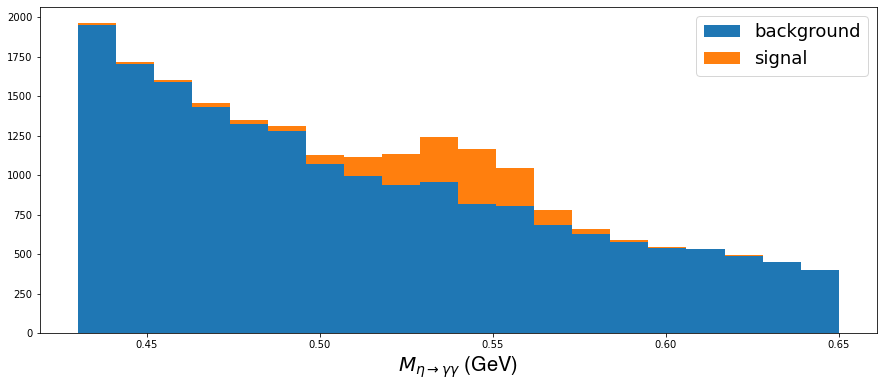

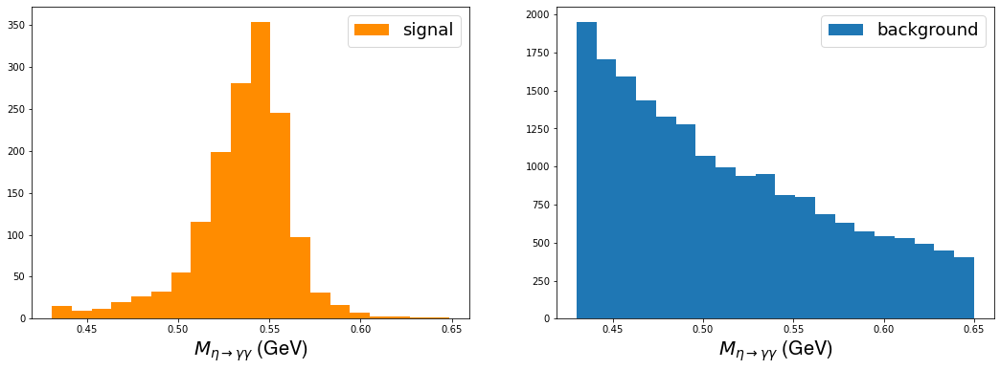

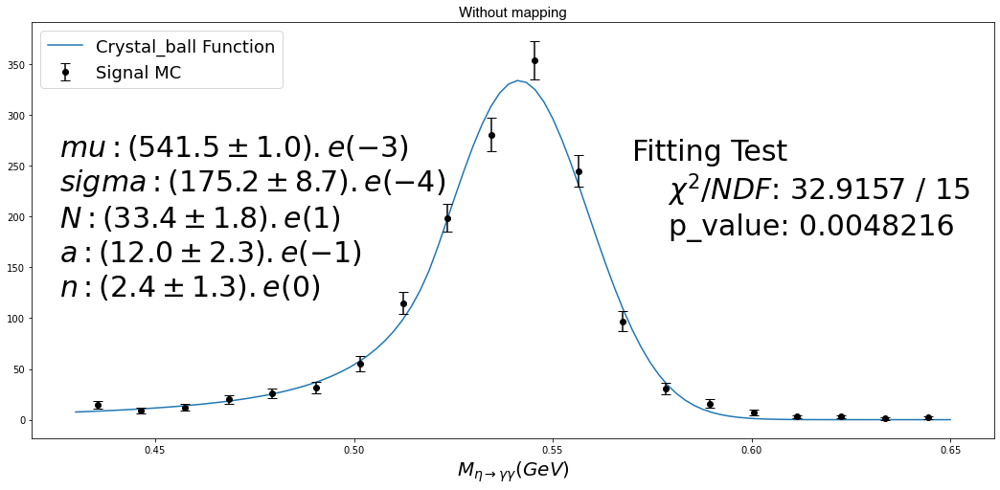

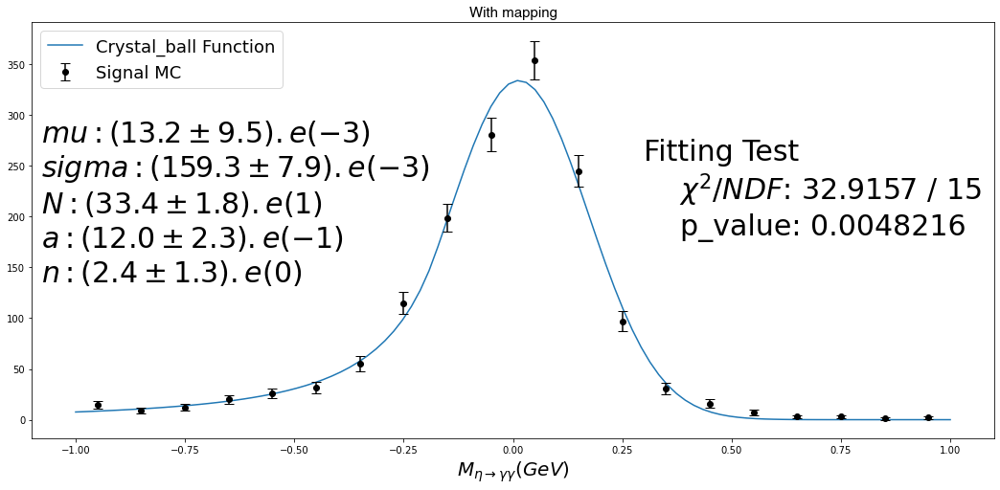

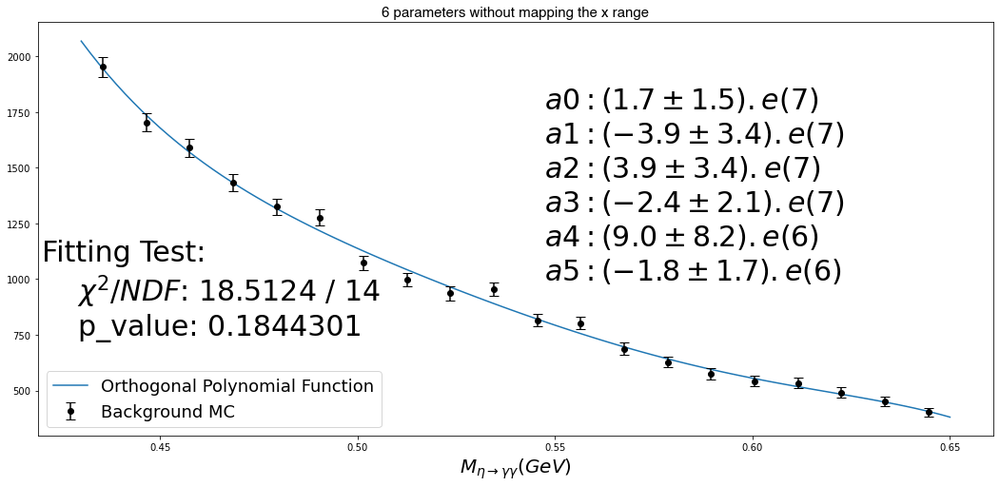

...

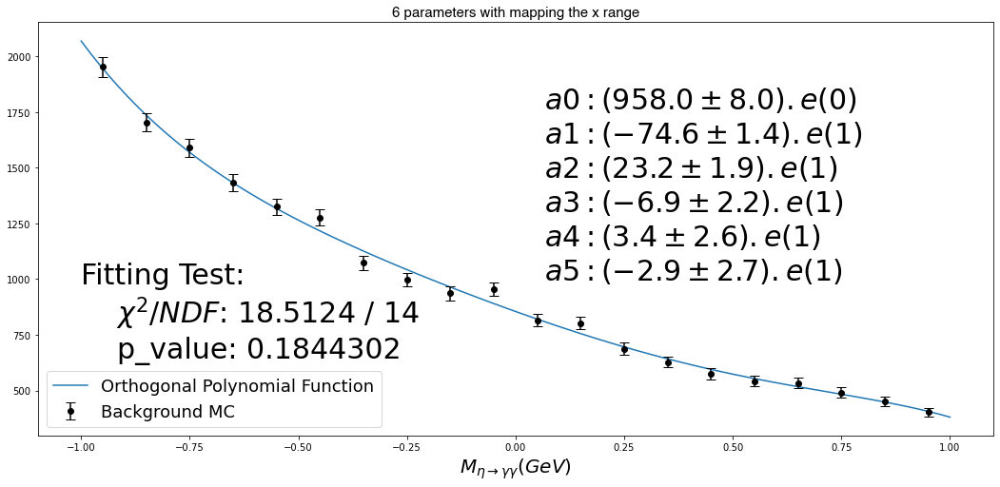

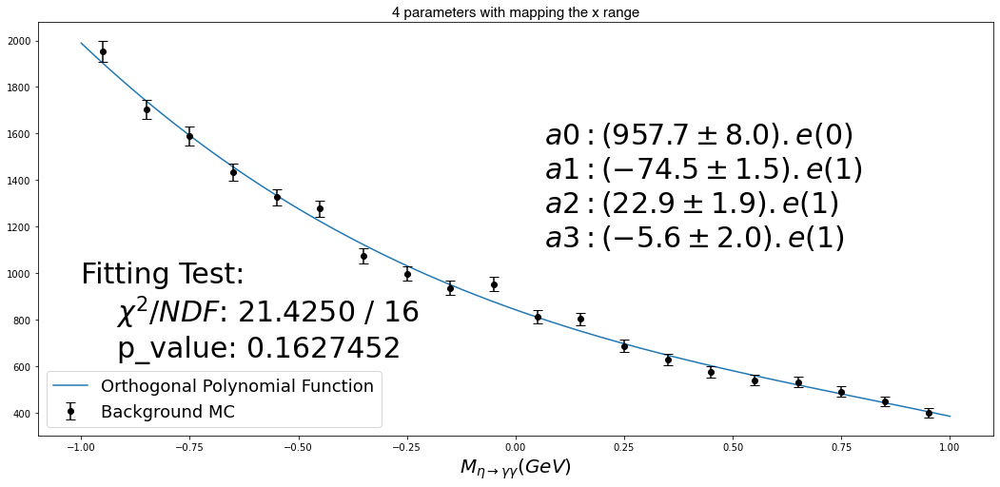

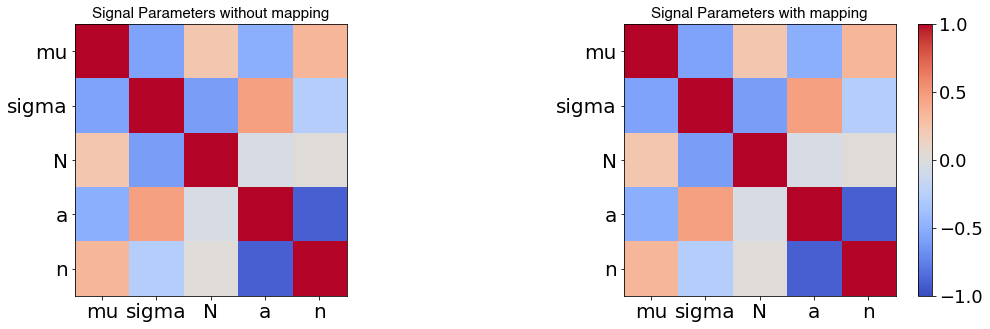

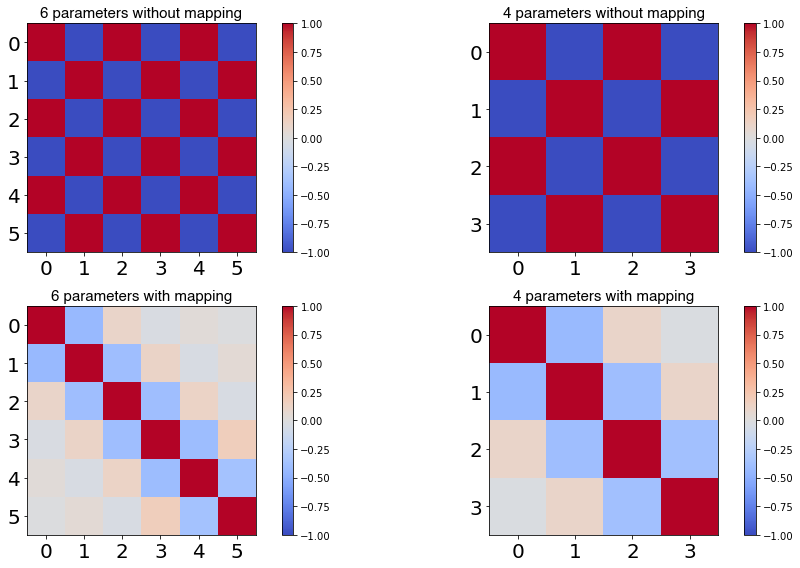

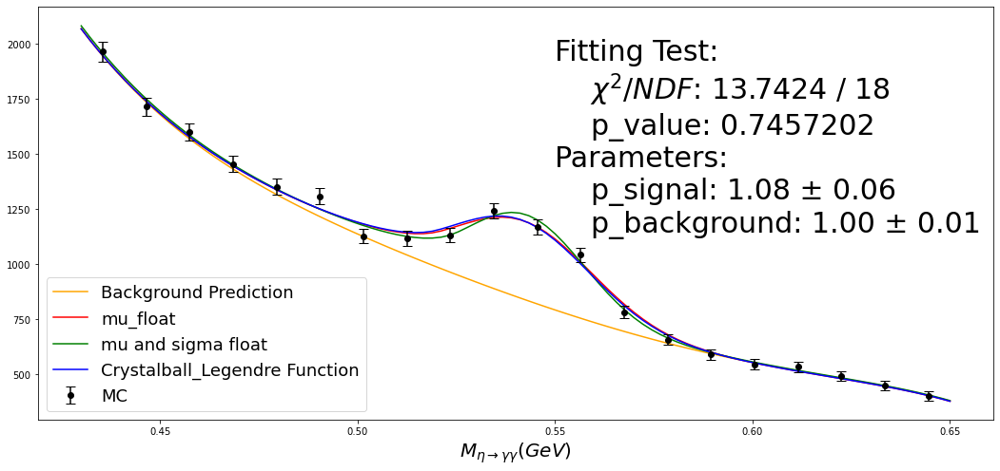

+--------------------+------------------+------------------+-----------------+-----------+
|        Type        |     p_signal     |   p_background   | chi_squared/NDF |  p_value  |
+--------------------+------------------+------------------+-----------------+-----------+
|  fixed sig params  | 1.076 ± 0.060871 | 0.996 ± 0.007668 |   13.7424 / 18  | 0.7457202 |
|     mu floats      | 1.074 ± 0.061963 | 0.996 ± 0.007800 |   13.4166 / 17  | 0.7078782 |
| mu and sigma float | 1.150 ± 0.063962 | 1.004 ± 0.007241 |   9.3836 / 16   | 0.8967776 |
+--------------------+------------------+------------------+-----------------+-----------+
fixed parameters
    p_sig: 1.076 ± 0.060871
    p_bkg: 0.996 ± 0.007668
mu floats
    p_sig: 1.074 ± 0.061963
    p_bkg: 0.996 ± 0.007800
mu and sigma float
    p_sig: 1.150 ± 0.063962
    p_bkg: 1.004 ± 0.007241



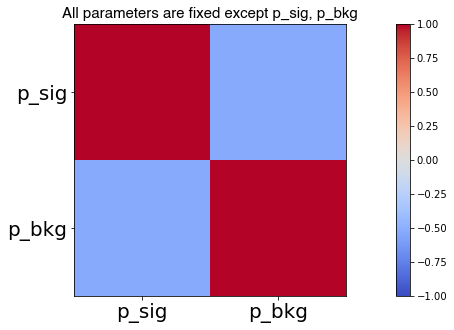

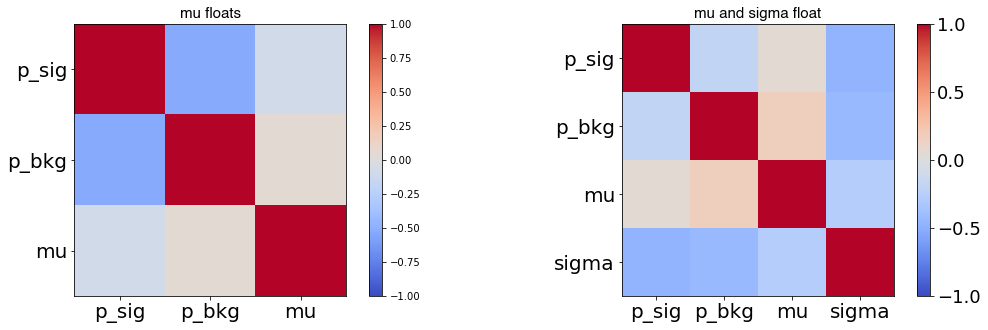

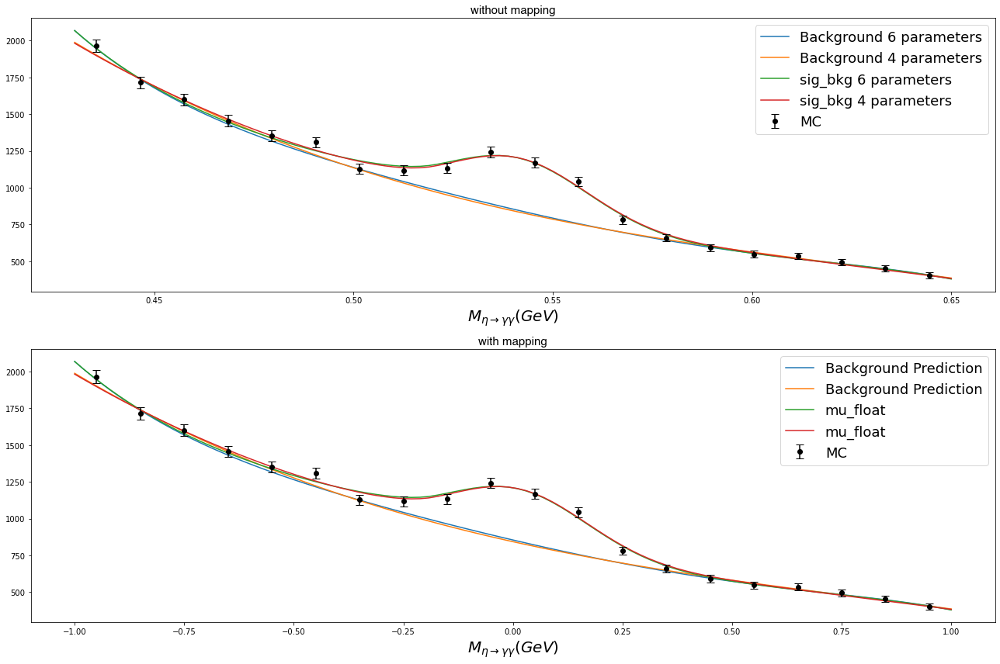

In [2]:
%run /Users/sahargholipour/Documents/MSc_Project/Semileptonic_Bdecay/eta_Fitting_InvM_cryslegendre.ipynb

In [3]:
# packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scipy.integrate as integrate
import scipy.stats as stats
from scipy.optimize import curve_fit
from numpy.polynomial.legendre import legval
from decimal import Decimal
import statistics

from IPython.display import display, Latex, HTML

form_title = {'family': 'helvetica', 'color': 'black', 'size': 15}
form_label = {'family': 'helvetica', 'color': 'black', 'size': 20}

# Function of splitting the signal and background
exec(open('functions.py').read())

In [4]:
data = pd.read_pickle('dataset_Abid.pkl')

In [5]:
data['__event__'].value_counts()

86500516     18
3606842      15
103077594    13
35687155     13
8010491      13
             ..
99919030      1
91402773      1
51071020      1
48994568      1
48123743      1
Name: __event__, Length: 142595, dtype: int64

In [6]:
pd.set_option('display.max_columns', 907)
data[data['__event__']==86500516]

__experiment__  __run__  __event__  __production__  __candidate__  \
68946             1003        0   86500516           24816              0   
68947             1003        0   86500516           24816              1   
68948             1003        0   86500516           24816              2   
68949             1003        0   86500516           24816              3   
68950             1003        0   86500516           24816              4   
68951             1003        0   86500516           24816              5   
68952             1003        0   86500516           24816              6   
68953             1003        0   86500516           24816              7   
68954             1003        0   86500516           24816              8   
245445            1003        0   86500516           24823              0   
245446            1003        0   86500516           24823              1   
245447            1003        0   86500516           24823              2   
245448            1003        0   86500516           24823              3   
245449            1003        0   86500516           24823              4   
245450            1003        0   86500516           24823              5   
245451            1003        0   86500516           24823              6   
245452            1003        0   86500516           24823              7   
245453            1003        0   86500516           24823              8   

        __ncandidates__  __weight__       Ecms  aBminusMode  aBplusMode  \
68946                 9         1.0  10.579557      -1021.0      1022.0   
68947                 9         1.0  10.579557      -1021.0      1022.0   
68948                 9         1.0  10.579557      -1021.0      1022.0   
68949                 9         1.0  10.579557      -1021.0      1022.0   
68950                 9         1.0  10.579557      -1021.0      1022.0   
68951                 9         1.0  10.579557      -1021.0      1022.0   
68952                 9         1.0  10.579557      -1021.0      1022.0   
68953                 9         1.0  10.579557      -1021.0      1022.0   
68954                 9         1.0  10.579557      -1021.0      1022.0   
245445                9         1.0  10.579557        -99.0       -99.0   
245446                9         1.0  10.579557        -99.0       -99.0   
245447                9         1.0  10.579557        -99.0       -99.0   
245448                9         1.0  10.579557        -99.0       -99.0   
245449                9         1.0  10.579557        -99.0       -99.0   
245450                9         1.0  10.579557        -99.0       -99.0   
245451                9         1.0  10.579557        -99.0       -99.0   
245452                9         1.0  10.579557        -99.0       -99.0   
245453                9         1.0  10.579557        -99.0       -99.0   

         aB0Mode  aBbar0Mode  aDstminusMode  aDstplusMode  aDminusMode  \
68946      -99.0       -99.0          -99.0         -99.0        -99.0   
68947      -99.0       -99.0          -99.0         -99.0        -99.0   
68948      -99.0       -99.0          -99.0         -99.0        -99.0   
68949      -99.0       -99.0          -99.0         -99.0        -99.0   
68950      -99.0       -99.0          -99.0         -99.0        -99.0   
68951      -99.0       -99.0          -99.0         -99.0        -99.0   
68952      -99.0       -99.0          -99.0         -99.0        -99.0   
68953      -99.0       -99.0          -99.0         -99.0        -99.0   
68954      -99.0       -99.0          -99.0         -99.0        -99.0   
245445 -101002.0   -101001.0          -99.0        1001.0        -99.0   
245446 -101002.0   -101001.0          -99.0        1001.0        -99.0   
245447 -101002.0   -101001.0          -99.0        1001.0        -99.0   
245448 -101002.0   -101001.0          -99.0        1001.0        -99.0   
245449 -101002.0   -101001.0          -99.0        1001.0        -99.0   
245450 -

In [7]:
# ignoring the warnings
import warnings
warnings.filterwarnings('ignore')

# MC Luminosity

In [8]:
mcNBB = 182500 * 2. *1393;   mclumi = mcNBB / 1100000.
print(f'Number of BB events (sum of B+B- and B0B0) = {mcNBB:6.3e}')
print(f'MC sample equivalent to {mclumi:.2f} fb-1')

Number of BB events (sum of B+B- and B0B0) = 5.084e+08
MC sample equivalent to 462.22 fb-1


# Reconstructing $\eta$ modes plus side bands and Generating Modes

In [100]:
# reconstructed eta modes plus etaSB
l_eta_Bp = [1600,1700,2600,2700]
eta_rec_Bp = list(i+1 for i in l_eta_Bp) + l_eta_Bp

l_eta_B0 = [1400,1500,2400,2500]
eta_rec_B0 = list(i+1 for i in l_eta_B0) + l_eta_B0

# reconstructed Dlnu
l_Dl_Bp = [300,400]
Dl_rec_Bp = list(i+1 for i in l_Dl_Bp) + l_Dl_Bp

l_Dl_B0 = [100,200]
Dl_rec_B0 = list(i+1 for i in l_Dl_B0) + l_Dl_B0

# generated Detalnu
eta_gen_Bp = [1019,1020,1039,1040]
eta_gen_B0 = [1017,1018,1035,1036]

# generated DDs
DDs_gen_Bp = [i+1681 for i in range(4)]
DDs_gen_B0 = [i+1833 for i in range(4)]

# First half of MC treating as data

## data

In [10]:
b2size_MC_data = pd.read_pickle('b2size_MCdata.pkl')

In [11]:
b2size_MC_data

__experiment__  __run__  __event__  \
rec_charged gen_charged 0                 1003        0  102626819   
                        1                 1003        0  102626819   
                        2                 1003        0  102626819   
                        3                 1003        0  102626819   
                        4                 1003        0   91390221   
...                                        ...      ...        ...   
rec_mixed   gen_mixed   213885            1003        0     308753   
                        213886            1003        0     308753   
                        213887            1003        0    1175564   
                        213888            1003        0    1175564   
                        213890            1003        0    1175564   

                                __production__  __candidate__  \
rec_charged gen_charged 0                24817              0   
                        1                24817              1   
                        2                24817              2   
                        3                24817              3   
                        4                24817              0   
...                                        ...            ...   
rec_mixed   gen_mixed   213885           25056              7   
                        213886           25056              8   
                        213887           25056              0   
                        213888           25056              1   
                        213890           25056              3   

                                __ncandidates__  __weight__       Ecms  \
rec_charged gen_charged 0                     4         1.0  10.579557   
                        1                     4         1.0  10.579557   
                        2                     4         1.0  10.579557   
                        3                     4         1.0  10.579557   
                        4                     9         1.0  10.579557   
...                                         ...         ...        ...   
rec_mixed   gen_mixed   213885                9         1.0  10.579557   
                        213886                9         1.0  10.579557   
                        213887                9         1.0  10.579557   
                        213888                9         1.0  10.579557   
                        213890                9         1.0  10.579557   

                                aBminusMode  aBplusMode   aB0Mode  aBbar0Mode  \
rec_charged gen_charged 0           -1021.0      1021.0     -99.0       -99.0   
                        1           -1021.0      1021.0     -99.0       -99.0   
                        2           -1021.0      1021.0     -99.0       -99.0   
                        3           -1021.0      1021.0     -99.0       -99.0   
                        4         -201001.0      1024.0     -99.0       -99.0   
...                                     ...         ...       ...         ...   
rec_mixed   gen_mixed   213885        -99.0       -99.0    1001.0     -1020.0   
                        213886        -99.0       -99.0    1001.0     -1020.0   
                        213887        -99.0       -99.0  101005.0   -101001.0   
                        213888        -99.0       -99.0  101005.0   -101001.0   
                        213890        -99.0       -99.0  101005.0   -101001.0   

                                aDstminusMode  aDstplusMode  aDminusMode  \
rec_charged gen_charged 0               -99.0         -99.0        -99.0   
                        1               -99.0         -99.0        -99.0   
                        2               -99.0         -99.0        -99.0   
                        3               -99.0         -99.0        -99.0   
                        4               -99.0         -99.0      -1033.0   
...                                       ...           ...          ...   
rec_mixed   gen_

In [12]:
b2size_MC_data.reset_index()

level_0      level_1  level_2  __experiment__  __run__  __event__  \
0       rec_charged  gen_charged        0            1003        0  102626819   
1       rec_charged  gen_charged        1            1003        0  102626819   
2       rec_charged  gen_charged        2            1003        0  102626819   
3       rec_charged  gen_charged        3            1003        0  102626819   
4       rec_charged  gen_charged        4            1003        0   91390221   
...             ...          ...      ...             ...      ...        ...   
280128    rec_mixed    gen_mixed   213885            1003        0     308753   
280129    rec_mixed    gen_mixed   213886            1003        0     308753   
280130    rec_mixed    gen_mixed   213887            1003        0    1175564   
280131    rec_mixed    gen_mixed   213888            1003        0    1175564   
280132    rec_mixed    gen_mixed   213890            1003        0    1175564   

        __production__  __candidate__  __ncandidates__  __weight__       Ecms  \
0                24817              0                4         1.0  10.579557   
1                24817              1                4         1.0  10.579557   
2                24817              2                4         1.0  10.579557   
3                24817              3                4         1.0  10.579557   
4                24817              0                9         1.0  10.579557   
...                ...            ...              ...         ...        ...   
280128           25056              7                9         1.0  10.579557   
280129           25056              8                9         1.0  10.579557   
280130           25056              0                9         1.0  10.579557   
280131           25056              1                9         1.0  10.579557   
280132           25056              3                9         1.0  10.579557   

        aBminusMode  aBplusMode   aB0Mode  aBbar0Mode  aDstminusMode  \
0           -1021.0      1021.0     -99.0       -99.0          -99.0   
1           -1021.0      1021.0     -99.0       -99.0          -99.0   
2           -1021.0      1021.0     -99.0       -99.0          -99.0   
3           -1021.0      1021.0     -99.0       -99.0          -99.0   
4         -201001.0      1024.0     -99.0       -99.0          -99.0   
...             ...         ...       ...         ...            ...   
280128        -99.0       -99.0    1001.0     -1020.0        -1002.0   
280129        -99.0       -99.0    1001.0     -1020.0        -1002.0   
280130        -99.0       -99.0  101005.0   -101001.0          -99.0   
280131        -99.0       -99.0  101005.0   -101001.0          -99.0   
280132        -99.0       -99.0  101005.0   -101001.0          -99.0   

        aDstplusMode  aDminusMode  aDplusMode  aD0Mode  aDbar0Mode       ECM  \
0              -99.0        -99.0       -99.0   1017.0   -101054.0  7.506005   
1              -99.0        -99.0       -99.0   1017.0   -101054.0  7.657668   
2              -99.0        -99.0       -99.0   1017.0   -101054.0  7.396241   
3              -99.0        -99.0       -99.0   1017.0   -101054.0  7.547904   
4              -99.0      -1033.0       -99.0   1034.0       -99.0  8.255596   
...              ...          ...         ...      ...         ...       ...   
280128         -99.0    -101033.0      1033.0    -99.0       -99.0  8.161023   
280129         -99.0    -101033.0      1033.0    -99.0       -99.0  7.702198   
280130        1002.0        -99.0      1025.0    -99.0     -1036.0  8.030956   
280131        1002.0        -99.0      1025.0    -99.0     -1036.0  8.022498   
280132        1002.0        -99.0      1025.0    -99.0     -1036.0  7.854474   

             pCM      InvM   cosThCM     phiCM     PDG  nROE_Ch  nROE_ECL  \
0       2.194899  7.177381  0.068266  0.634615  300553      0.0       2.0   
1       2.256126  7.317448  0.055818  0.627172  300553      0.0       0.0   
2       2

In [13]:
print(f'''Charged length: {len(b2size_MC_data.loc['rec_charged'])}
Mixed length: {len(b2size_MC_data.loc['rec_mixed'])}
Charged + Mixed: {len(b2size_MC_data.loc['rec_charged'])+len(b2size_MC_data.loc['rec_mixed'])}
b2size_MC_dataset length: {len(b2size_MC_data)}
''')

Charged length: 191670
Mixed length: 88463
Charged + Mixed: 280133
b2size_MC_dataset length: 280133



## only $\eta$

In [14]:
# because it's gonna be my data and in Belle2 data all are together and we can't seperate charged and mixeed BB
# so I droped the multi index and I asked for recunstructing one B as D(*)etalnu and the other as D(*)lnu
eta_df_b2size_MC_data = b2size_MC_data.reset_index(drop=True)
eta_df_b2size_MC_data = eta_df_b2size_MC_data[
    ((eta_df_b2size_MC_data['B0_decayModeID'].isin(eta_rec_Bp + eta_rec_B0)) & (eta_df_b2size_MC_data['B1_decayModeID']<500))
    |
    ((eta_df_b2size_MC_data['B1_decayModeID'].isin(eta_rec_Bp + eta_rec_B0)) & (eta_df_b2size_MC_data['B0_decayModeID']<500))
]
eta_df_b2size_MC_data

__experiment__  __run__  __event__  __production__  __candidate__  \
34                1003        0   37238806           24817              7   
46                1003        0   34920371           24817              0   
47                1003        0   34920371           24817              1   
48                1003        0   34920371           24817              2   
49                1003        0   34920371           24817              3   
...                ...      ...        ...             ...            ...   
280095            1003        0     201590           25056              3   
280096            1003        0     201590           25056              4   
280111            1003        0    1146893           25056              0   
280123            1003        0     308753           25056              2   
280124            1003        0     308753           25056              3   

        __ncandidates__  __weight__       Ecms  aBminusMode  aBplusMode  \
34                    9         1.0  10.579557      -1005.0      1002.0   
46                    9         1.0  10.579557      -1021.0      1021.0   
47                    9         1.0  10.579557      -1021.0      1021.0   
48                    9         1.0  10.579557      -1021.0      1021.0   
49                    9         1.0  10.579557      -1021.0      1021.0   
...                 ...         ...        ...          ...         ...   
280095                9         1.0  10.579557        -99.0       -99.0   
280096                9         1.0  10.579557        -99.0       -99.0   
280111                9         1.0  10.579557        -99.0       -99.0   
280123                9         1.0  10.579557        -99.0       -99.0   
280124                9         1.0  10.579557        -99.0       -99.0   

        aB0Mode  aBbar0Mode  aDstminusMode  aDstplusMode  aDminusMode  \
34        -99.0       -99.0          -99.0         -99.0        -99.0   
46        -99.0       -99.0          -99.0         -99.0        -99.0   
47        -99.0       -99.0          -99.0         -99.0        -99.0   
48        -99.0       -99.0          -99.0         -99.0        -99.0   
49        -99.0       -99.0          -99.0         -99.0        -99.0   
...         ...         ...            ...           ...          ...   
280095   1019.0      1019.0        -1001.0         -99.0        -99.0   
280096   1019.0      1019.0        -1001.0         -99.0        -99.0   
280111   1010.0     -1001.0          -99.0        1001.0      -1033.0   
280123   1001.0     -1020.0        -1002.0         -99.0    -101033.0   
280124   1001.0     -1020.0        -1002.0         -99.0    -101033.0   

        aDplusMode  aD0Mode  aDbar0Mode       ECM       pCM      InvM  \
34           -99.0   1017.0     -1017.0  7.859379  1.314339  7.749033   
46           -99.0   1036.0     -1036.0  9.274199  1.454225  9.160694   
47           -99.0   1036.0     -1036.0  9.283177  1.430787  9.173329   
48           -99.0   1036.0     -1036.0  9.255945  1.490120  9.136028   
49           -99.0   1036.0     -1036.0  9.102272  1.539251  8.972235   
...            ...      ...         ...       ...       ...       ...   
280095       -99.0    -99.0     -1070.0  9.135310  1.566104  8.999661   
280096       -99.0    -99.0     -1070.0  9.399369  1.381175  9.296497   
280111       -99.0   1036.0       -99.0  8.111272  2.362353  7.758088   
280123      1033.0    -99.0       -99.0  8.229449  2.738564  7.760059   
280124      1033.0    -99.0       -99.0  8.374695  2.704043  7.925560   

         cosThCM     phiCM     PDG  nROE_Ch  nROE_ECL  nROE_KL  nROE_gam  \
34      0.090012  1.987016  300553      0.0       5.0      0.0       5.0   
46      0.440787  0.186991  300553      0.0       1.0      1.0       1.0   
47      0.447526  0.215787  300553      0.0       1.0      1.0       1.0   
48      0.448083  0.213400  300553      0.0       1.0      1.0       1.0   
49      0.416443  0.223867  300553      0.0     

In [15]:
# in mixed BB reconstructing one B as charged e.g. D(*)0etal-nu and the other one D(*)-l+nu
d = eta_df_b2size_MC_data[eta_df_b2size_MC_data['decayModeID']!=3005530]
d.query(f'(((B0_decayModeID=={eta_rec_Bp}) & (B1_decayModeID<500)) | ((B1_decayModeID=={eta_rec_Bp}) & (B0_decayModeID<500)))')

__experiment__  __run__  __event__  __production__  __candidate__  \
191728            1003        0  105766947           24817              2   
191729            1003        0  105766947           24817              3   
192290            1003        0   10939510           24817              5   
192291            1003        0   10939510           24817              6   
192292            1003        0   10939510           24817              7   
...                ...      ...        ...             ...            ...   
279879            1003        0    1238992           25056              0   
279882            1003        0    1238992           25056              3   
280093            1003        0     201590           25056              1   
280095            1003        0     201590           25056              3   
280096            1003        0     201590           25056              4   

        __ncandidates__  __weight__       Ecms  aBminusMode  aBplusMode  \
191728                8         1.0  10.579557      -1727.0      1020.0   
191729                8         1.0  10.579557      -1727.0      1020.0   
192290                9         1.0  10.579557      -1021.0      1792.0   
192291                9         1.0  10.579557      -1021.0      1792.0   
192292                9         1.0  10.579557      -1021.0      1792.0   
...                 ...         ...        ...          ...         ...   
279879                9         1.0  10.579557        -99.0       -99.0   
279882                9         1.0  10.579557        -99.0       -99.0   
280093                9         1.0  10.579557        -99.0       -99.0   
280095                9         1.0  10.579557        -99.0       -99.0   
280096                9         1.0  10.579557        -99.0       -99.0   

        aB0Mode  aBbar0Mode  aDstminusMode  aDstplusMode  aDminusMode  \
191728    -99.0       -99.0          -99.0         -99.0      -1033.0   
191729    -99.0       -99.0          -99.0         -99.0      -1033.0   
192290    -99.0       -99.0          -99.0         -99.0        -99.0   
192291    -99.0       -99.0          -99.0         -99.0        -99.0   
192292    -99.0       -99.0          -99.0         -99.0        -99.0   
...         ...         ...            ...           ...          ...   
279879  -1019.0     -1019.0          -99.0        1001.0        -99.0   
279882  -1019.0     -1019.0          -99.0        1001.0        -99.0   
280093   1019.0      1019.0        -1001.0         -99.0        -99.0   
280095   1019.0      1019.0        -1001.0         -99.0        -99.0   
280096   1019.0      1019.0        -1001.0         -99.0        -99.0   

        aDplusMode  aD0Mode  aDbar0Mode       ECM       pCM      InvM  \
191728       -99.0   1002.0     -1034.0  8.344347  1.370755  8.232840   
191729       -99.0   1002.0     -1034.0  8.243684  1.387210  8.126552   
192290       -99.0   1036.0     -1017.0  8.493103  1.841986  8.290013   
192291       -99.0   1036.0     -1017.0  8.667779  1.770792  8.483934   
192292       -99.0   1036.0     -1017.0  8.654085  1.798490  8.464067   
...            ...      ...         ...       ...       ...       ...   
279879       -99.0   1017.0       -99.0  7.699898  1.702457  7.509844   
279882       -99.0   1017.0       -99.0  7.699898  1.702457  7.508538   
280093       -99.0    -99.0     -1070.0  9.113005  1.373950  9.008693   
280095       -99.0    -99.0     -1070.0  9.135310  1.566104  8.999661   
280096       -99.0    -99.0     -1070.0  9.399369  1.381175  9.296497   

         cosThCM     phiCM     PDG  nROE_Ch  nROE_ECL  nROE_KL  nROE_gam  \
191728 -0.526973  0.190655  300553      0.0       4.0      0.0       4.0   
191729 -0.513282 -0.004826  300553      0.0       5.0      0.0       5.0   
192290  0.820531  2.955778  300553      0.0       5.0      1.0       5.0   
192291  0.834377  3.027164  300553      0.0       3.0      1.0       3.0   
192292  0.839522  2.999499  300553      0.0     

In [122]:
abs(d.query(f'B0_decayModeID=={eta_rec_Bp}')['aBbar0Mode']).isin([1017,1018,1035,1036]).value_counts()

False    1375
True       44
Name: aBbar0Mode, dtype: int64

## Taking the best (first/min) candidate of each event

In [17]:
eta_df_b2size_MC_data['__candidate__'].value_counts()

0    5790
1    4977
2    4139
3    3464
4    3059
5    2623
6    2323
7    2161
8    1944
Name: __candidate__, dtype: int64

In [19]:
eta_df_b2size_MC_data_mincans, _ = bestcan(eta_df_b2size_MC_data)

In [20]:
len(eta_df_b2size_MC_data.groupby('__event__'))

9729

In [21]:
len(eta_df_b2size_MC_data_mincans)

9729

In [22]:
eta_df_b2size_MC_data_mincans['__candidate__'].value_counts()

0    5790
1    1251
2     986
3     453
4     422
6     246
5     241
7     174
8     166
Name: __candidate__, dtype: int64

## $M_{\eta \rightarrow \gamma\gamma}$

In [23]:
eta_b2size_MC_data_InvM = pd.concat(
    [eta_df_b2size_MC_data_mincans['pi4_B0_InvM'], eta_df_b2size_MC_data_mincans['pi4_B1_InvM']]
)                      

## Plot

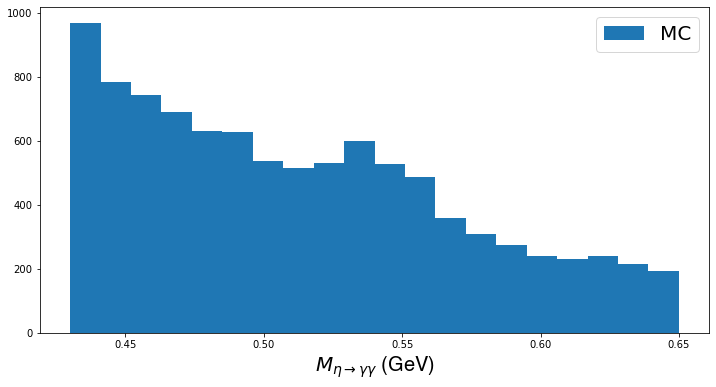

In [24]:
plt.figure(figsize=(12,6))
count, edge, _ = plt.hist(eta_b2size_MC_data_InvM, bins=20, label='MC')
plt.xlabel(r'$M_{\eta \rightarrow \gamma \gamma}$ (GeV)', fontdict=form_label)
plt.legend(fontsize=20)
plt.show()

# Second half of MC as the simulated data_set

## data

It has both $\eta$ and $\pi$

In [133]:
# No charged particles in ROE and the Eextra_ROE should be less than one
b2size_MC = pd.read_pickle('b2size_MC.pkl')
b2size_MC

__experiment__  __run__  __event__  \
rec_charged gen_charged 0                 1003        0    8640457   
                        1                 1003        0    8640457   
                        2                 1003        0    8640457   
                        12                1003        0   12624230   
                        13                1003        0   12624230   
...                                        ...      ...        ...   
rec_mixed   gen_mixed   217135            1003        0    6391035   
                        217136            1003        0    6391035   
                        217137            1003        0    6391035   
                        217138            1003        0    6391035   
                        217139            1003        0    6391035   

                                __production__  __candidate__  \
rec_charged gen_charged 0                24816              0   
                        1                24816              1   
                        2                24816              2   
                        12               24816              0   
                        13               24816              1   
...                                        ...            ...   
rec_mixed   gen_mixed   217135           24825              4   
                        217136           24825              5   
                        217137           24825              6   
                        217138           24825              7   
                        217139           24825              8   

                                __ncandidates__  __weight__       Ecms  \
rec_charged gen_charged 0                     3         1.0  10.579557   
                        1                     3         1.0  10.579557   
                        2                     3         1.0  10.579557   
                        12                    9         1.0  10.579557   
                        13                    9         1.0  10.579557   
...                                         ...         ...        ...   
rec_mixed   gen_mixed   217135                9         1.0  10.579557   
                        217136                9         1.0  10.579557   
                        217137                9         1.0  10.579557   
                        217138                9         1.0  10.579557   
                        217139                9         1.0  10.579557   

                                aBminusMode  aBplusMode  aB0Mode  aBbar0Mode  \
rec_charged gen_charged 0         -101002.0      1021.0    -99.0       -99.0   
                        1         -101002.0      1021.0    -99.0       -99.0   
                        2         -101002.0      1021.0    -99.0       -99.0   
                        12        -101001.0      1022.0    -99.0       -99.0   
                        13        -101001.0      1022.0    -99.0       -99.0   
...                                     ...         ...      ...         ...   
rec_mixed   gen_mixed   217135        -99.0       -99.0   1929.0    101019.0   
                        217136        -99.0       -99.0   1929.0    101019.0   
                        217137        -99.0       -99.0   1929.0    101019.0   
                        217138        -99.0       -99.0   1929.0    101019.0   
                        217139        -99.0       -99.0   1929.0    101019.0   

                                aDstminusMode  aDstplusMode  aDminusMode  \
rec_charged gen_charged 0               -99.0         -99.0        -99.0   
                        1               -99.0         -99.0        -99.0   
                        2               -99.0         -99.0        -99.0   
                        12              -99.0         -99.0        -99.0   
                        13              -99.0         -99.0        -99.0   
...                                       ...           ...          ...   
rec_mixed   gen_mixed   2171

In [26]:
print(f'''Charged length (based on the label): {len(b2size_MC.loc['rec_charged'])}
Charged length (based on the decayMOdeID): {len(b2size_MC[b2size_MC['decayModeID']==3005530])}
Mixed length (based on the label): {len(b2size_MC.loc['rec_mixed'])}
Mixed length (based on the decayModeID): {len(b2size_MC[b2size_MC['decayModeID']!=3005530])}
Charged + Mixed: {len(b2size_MC.loc['rec_charged'])+len(b2size_MC.loc['rec_mixed'])}
b2size_MC_dataset length: {len(b2size_MC)}
''')

Charged length (based on the label): 192101
Charged length (based on the decayMOdeID): 192101
Mixed length (based on the label): 88886
Mixed length (based on the decayModeID): 88886
Charged + Mixed: 280987
b2size_MC_dataset length: 280987



In [124]:
del b2size_MC, b2size_MC_data, d, eta_df_b2size_MC_data, eta_df_b2size_MC_data_mincans, charged_df, eta_df_BmBp, eta_df_Bbar0B0

In [125]:
import psutil
# gives a single float value
psutil.cpu_percent()
# gives an object with many fields
psutil.virtual_memory()
# you can convert that object to a dictionary 
dict(psutil.virtual_memory()._asdict())
# you can have the percentage of used RAM
psutil.virtual_memory().percent
# you can calculate percentage of available memory
psutil.virtual_memory().available * 100 / psutil.virtual_memory().total

3.501605987548828

## Only $\eta$

### $B^-B^+$

In [27]:
# taking only reconstructed charged BBbar
# charged_df = b2size_MC.loc['rec_charged'].reset_index(drop=True)
charged_df = b2size_MC.loc['rec_charged']
# reconstructing one B as Dlnu one as Detalnu
eta_df_BmBp = charged_df.query(
    f'( ((B0_decayModeID=={eta_rec_Bp}) & (B1_decayModeID=={Dl_rec_Bp})) | ((B1_decayModeID=={eta_rec_Bp}) & (B0_decayModeID=={Dl_rec_Bp})) )'
)
# min candidates in each event
eta_df_BmBp_mincans, _ = bestcan(eta_df_BmBp)

In [28]:
# Above I first took only BmBp pairs first, then I said one Detalnu and the other one Dlnu
# But here I asked the whole dataset to give me one B Detalnu and the other Dlnu
Deta_Dl = b2size_MC.query(
    f'(((B0_decayModeID=={eta_rec_Bp}) & (B1_decayModeID=={Dl_rec_Bp})) | ((B1_decayModeID=={eta_rec_Bp}) & (B0_decayModeID=={Dl_rec_Bp})))'
)

In [29]:
print(f'''BmBp
Length of reconstructed BmBp: {len(charged_df)}
Length of reconstructing one B as Dlnu and one as Detalnu from charged_df: {len(eta_df_BmBp)}
Length of reconstructing one B as Dlnu and one as Detalnu directly from the whole dataset: {len(Deta_Dl)}
Length of taking min candidates from each event of this dataset: {len(eta_df_BmBp_mincans)}
''')

BmBp
Length of reconstructed BmBp: 192101
Length of reconstructing one B as Dlnu and one as Detalnu from charged_df: 24613
Length of reconstructing one B as Dlnu and one as Detalnu directly from the whole dataset: 24613
Length of taking min candidates from each event of this dataset: 7219



Bellow I'm checking how many times we get $B \rightarrow D D_s$

In [35]:
# let's check if we have null or nan values in aBplusMode variable
eta_df_BmBp_mincans['aBplusMode'].isnull().sum(), eta_df_BmBp_mincans['aBplusMode'].isna().sum()

(0, 0)

In [70]:
np.unique(eta_df_BmBp_mincans[(eta_df_BmBp_mincans['aBplusMode']%10000) > 1680]['aBplusMode'])

array([-9.90000e+01,  1.68100e+03,  1.68200e+03,  1.68300e+03,
        1.68400e+03,  1.68500e+03,  1.68800e+03,  1.68900e+03,
        1.69000e+03,  1.69200e+03,  1.69400e+03,  1.69700e+03,
        1.70000e+03,  1.70100e+03,  1.70300e+03,  1.70400e+03,
        1.70600e+03,  1.70700e+03,  1.70800e+03,  1.71300e+03,
        1.71900e+03,  1.72600e+03,  1.72700e+03,  1.72800e+03,
        1.72900e+03,  1.73000e+03,  1.73100e+03,  1.73200e+03,
        1.73300e+03,  1.73400e+03,  1.73700e+03,  1.73900e+03,
        1.74000e+03,  1.74300e+03,  1.74500e+03,  1.74600e+03,
        1.74700e+03,  1.74800e+03,  1.75000e+03,  1.75100e+03,
        1.75200e+03,  1.75300e+03,  1.75400e+03,  1.75500e+03,
        1.75600e+03,  1.75800e+03,  1.75900e+03,  1.76400e+03,
        1.76500e+03,  1.76800e+03,  1.77000e+03,  1.77100e+03,
        1.77200e+03,  1.77300e+03,  1.77400e+03,  1.79200e+03,
        1.82200e+03,  1.01682e+05,  1.01684e+05,  1.01730e+05,
        1.01731e+05,  1.01737e+05,  1.01740e+05,  1.017

In [33]:
# let's check the type of the column
eta_df_BmBp_mincans['aBplusMode'].dtype

dtype('float64')

In [54]:
# I remove -99 values from this variable
cut = eta_df_BmBp_mincans[eta_df_BmBp_mincans['aBplusMode']==-99.]
type(eta_df_BmBp_mincans['aBplusMode'].drop(cut.index))

pandas.core.series.Series

In [62]:
greater_than_number = (eta_df_BmBp_mincans['aBplusMode'].drop(cut.index)%10000 > 1680)
print(greater_than_number)

0        False
4        False
10       False
11       False
17       False
         ...  
23761    False
23763    False
23765    False
23773    False
23780    False
Name: aBplusMode, Length: 6934, dtype: bool


In [63]:
eta_df_BmBp_mincans[eta_df_BmBp_mincans['aBplusMode']>1680]['aBplusMode']

11       301002.0
18         1681.0
25         1682.0
32       101001.0
41       101022.0
           ...   
23682    101023.0
23689    101005.0
23705    101005.0
23727    101006.0
23755    101021.0
Name: aBplusMode, Length: 2300, dtype: float64

#### signal and background

Note: ( ~( ((abs(eta_df_bkg_BmBp['aBminusMode'])%10000).isin(eta_gen_Bp)) & ((eta_df_bkg_BmBp['B0_decayModeID']).isin(eta_rec_Bp)) ) & (eta_df_bkg_BmBp['pi4_B0_isSignal']==1) )
    |
    ( ~( ((abs(eta_df_bkg_BmBp['aBplusMode'])%10000).isin(eta_gen_Bp)) & ((eta_df_bkg_BmBp['B1_decayModeID']).isin(eta_rec_Bp)) )& (eta_df_bkg_BmBp['pi4_B1_isSignal']==1) ) this is a wrong approach to get peaking background.
    
<font color='blue'>I made a list of $D D_s$ modes and I said we `reconstruct` $D\eta l\nu$ but it was `generated` $D D_s$

In [101]:
# signal
eta_df_sig_BmBp = eta_df_BmBp_mincans[
    ( ((abs(eta_df_BmBp_mincans['aBminusMode'])%10000).isin(eta_gen_Bp)) & ((eta_df_BmBp_mincans['B0_decayModeID']).isin(eta_rec_Bp)) & (eta_df_BmBp_mincans['pi4_B0_isSignal']==1) )
    |
    ( (((eta_df_BmBp_mincans['aBplusMode'])%10000).isin(eta_gen_Bp)) & ((eta_df_BmBp_mincans['B1_decayModeID']).isin(eta_rec_Bp)) & (eta_df_BmBp_mincans['pi4_B1_isSignal']==1) )
]
# background
eta_df_bkg_BmBp = eta_df_BmBp_mincans.drop(eta_df_sig_BmBp.index, inplace=False)
# peaking background
eta_df_pkg_BmBp = eta_df_bkg_BmBp[
    ( ((abs(eta_df_bkg_BmBp['aBminusMode'])%10000).isin(DDs_gen_Bp)) & ((eta_df_bkg_BmBp['B0_decayModeID']).isin(eta_rec_Bp)) & (eta_df_bkg_BmBp['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_bkg_BmBp['aBplusMode'])%10000).isin(DDs_gen_Bp)) & ((eta_df_bkg_BmBp['B1_decayModeID']).isin(eta_rec_Bp)) & (eta_df_bkg_BmBp['pi4_B1_isSignal']==1) )
]
# combinatorial background
eta_df_ckg_BmBp = eta_df_bkg_BmBp.drop(eta_df_pkg_BmBp.index)

# signal + peaking background as my signal
eta_df_sigpkg_BmBp = pd.concat([eta_df_sig_BmBp, eta_df_pkg_BmBp])

In [102]:
print(f'''BmBp
Length of the selected data: {len(eta_df_BmBp_mincans)}
Length sig + bkg: {len(eta_df_sig_BmBp) + len(eta_df_bkg_BmBp)}
Length of signal: {len(eta_df_sig_BmBp)}
Length of peaking background: {len(eta_df_pkg_BmBp)}
Length of combinatorial background: {len(eta_df_ckg_BmBp)}
Length of total background: {len(eta_df_bkg_BmBp)}
Length of pkg + ckg: {len(eta_df_pkg_BmBp) + len(eta_df_ckg_BmBp)}
Length sig + pkg: {len(eta_df_sigpkg_BmBp)}
''')

BmBp
Length of the selected data: 7219
Length sig + bkg: 7219
Length of signal: 296
Length of peaking background: 60
Length of combinatorial background: 6863
Length of total background: 6923
Length of pkg + ckg: 6923
Length sig + pkg: 356



In [96]:
# B+ generated as DDs but reconstructed as Detalnu
eta_df_bkg_BmBp[((eta_df_bkg_BmBp['aBplusMode'])%10000).isin([1681,1682,1683,1684]) & (eta_df_bkg_BmBp['B1_decayModeID']).isin(eta_rec_Bp) & eta_df_bkg_BmBp['pi4_B1_isSignal']==1]

level_0  level_1  __experiment__  __run__  __event__  \
25     gen_charged      786            1003        0   17946909   
270    gen_charged     4564            1003        0    9120699   
474    gen_charged     7506            1003        0   26819510   
511    gen_charged     7775            1003        0   20969430   
1013   gen_charged    15388            1003        0   40595336   
1089   gen_charged    16475            1003        0   49275513   
1116   gen_charged    17073            1003        0   51509361   
1486   gen_charged    24145            1003        0    8634630   
2497   gen_charged    40715            1003        0   75967726   
2854   gen_charged    47347            1003        0   63086005   
4569   gen_charged    73231            1003        0   24672304   
4598   gen_charged    73654            1003        0   28203620   
4726   gen_charged    75043            1003        0   80281046   
5112   gen_charged    80093            1003        0   30519416   
5432   gen_charged    86269            1003        0    5137309   
6950   gen_charged   110221            1003        0   51120028   
8062   gen_charged   126398            1003        0  103870914   
8159   gen_charged   127656            1003        0  103545366   
10915  gen_charged   171007            1003        0    1990520   
11088  gen_charged   173567            1003        0   54704495   
12470  gen_charged   194262            1003        0   37555735   
12533  gen_charged   194929            1003        0   34711251   
14905  gen_charged   231095            1003        0   25606400   
15730  gen_charged   244126            1003        0   73195253   
16815  gen_charged   261919            1003        0   69751214   
16928  gen_charged   263758            1003        0   61206167   
18102  gen_charged   281327            1003        0    8564985   
18336  gen_charged   285315            1003        0   23972253   
18736  gen_charged   291820            1003        0   22016213   
20171  gen_charged   316616            1003        0   78736315   
20324  gen_charged   318254            1003        0   41598438   
21557  gen_charged   336326            1003        0   57176156   
23258  gen_charged   362529            1003        0   24359538   

       __production__  __candidate__  __ncandidates__  __weight__       Ecms  \
25              24816              0                2         1.0  10.579557   
270             24816              2                4         1.0  10.579557   
474             24816              0                3         1.0  10.579557   
511             24816              0                2         1.0  10.579557   
1013            24816              1                9         1.0  10.579557   
1089            24816              0                2         1.0  10.579557   
1116            24816              0                2         1.0  10.579557   
1486            24816              0                9         1.0  10.579557   
2497            24816              0                9         1.0  10.579557   
2854            24816              0                9         1.0  10.579557   
4569            24816              2                6         1.0  10.579557   
4598            24816              0                1         1.0  10.579557   
4726            24816              0                9         1.0  10.579557   
5112            24816              0                8         1.0  10.579557   
5432            24816              0                9         1.0  10.579557   
6950            24816              2                9         1.0  10.579557   
8062            24816              0                4         1.0  10.579557   
8159            24816              0                8         1.0  10.579557   
10915           24817              5                9         1.0  10.579557   
11088           24817              0                2         1.0  10.579557   
12470           24817              0                

In [91]:
# length of B+ generated as DDs but reconstructed as Detalnu
len(eta_df_bkg_BmBp1[((eta_df_bkg_BmBp1['aBplusMode'])%10000).isin([1681,1682,1683,1684]) & (eta_df_bkg_BmBp1['B1_decayModeID']).isin(eta_rec_Bp) & eta_df_bkg_BmBp1['pi4_B1_isSignal']==1])   

33

In [92]:
# length of # B- generated as DDs but reconstructed as Detalnu
len(eta_df_bkg_BmBp1[(abs(eta_df_bkg_BmBp1['aBminusMode'])%10000).isin([1681,1682,1683,1684]) & (eta_df_bkg_BmBp1['B0_decayModeID']).isin(eta_rec_Bp) & eta_df_bkg_BmBp1['pi4_B0_isSignal']==1])    

27

In [94]:
# signal + peaking background(the two cells above)
27+33+296

356

### $\bar{B}^0 B^0$

In [104]:
# taking only reconstructed mixed BBbar
neutral_df = b2size_MC[b2size_MC['decayModeID']==3005531]
# reconstructing one B as Dlnu one as Detalnu
eta_df_Bbar0B0 = neutral_df.query(
    f'( ((B0_decayModeID=={eta_rec_B0}) & (B1_decayModeID=={Dl_rec_B0})) | ((B1_decayModeID=={eta_rec_B0}) & (B0_decayModeID=={Dl_rec_B0})) )'
)
# min candidates in each event
eta_df_Bbar0B0_mincans, _ = bestcan(eta_df_Bbar0B0)

In [105]:
print(f'''B0barB0
Length of reconstructed Bbar0B0: {len(neutral_df)}
Length of reconstructing one B as Dlnu and one as Detalnu: {len(eta_df_Bbar0B0)}
Length of taking min candidates from each event of this dataset: {len(eta_df_Bbar0B0_mincans)}
''')

B0barB0
Length of reconstructed Bbar0B0: 45953
Length of reconstructing one B as Dlnu and one as Detalnu: 2823
Length of taking min candidates from each event of this dataset: 1295



#### signal and background

In [106]:
# signal 
eta_df_sig_Bbar0B0 = eta_df_Bbar0B0_mincans[
    ( ((abs(eta_df_Bbar0B0_mincans['aBbar0Mode'])%10000).isin(eta_gen_B0)) & ((eta_df_Bbar0B0_mincans['B0_decayModeID']).isin(eta_rec_B0)) & (eta_df_Bbar0B0_mincans['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_Bbar0B0_mincans['aB0Mode'])%10000).isin(eta_gen_B0)) & ((eta_df_Bbar0B0_mincans['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_Bbar0B0_mincans['pi4_B1_isSignal']==1) )
]
# background
eta_df_bkg_Bbar0B0 = eta_df_Bbar0B0_mincans.drop(eta_df_sig_Bbar0B0.index)
# peaking background
eta_df_pkg_Bbar0B0 = eta_df_bkg_Bbar0B0[
    ( ((abs(eta_df_bkg_Bbar0B0['aBbar0Mode'])%10000).isin(DDs_gen_B0)) & ((eta_df_bkg_Bbar0B0['B0_decayModeID']).isin(eta_rec_B0)) & (eta_df_bkg_Bbar0B0['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_bkg_Bbar0B0['aB0Mode'])%10000).isin(DDs_gen_B0)) & ((eta_df_bkg_Bbar0B0['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_bkg_Bbar0B0['pi4_B1_isSignal']==1) )
]
# combinatorial background
eta_df_ckg_Bbar0B0 = eta_df_bkg_Bbar0B0.drop(eta_df_pkg_Bbar0B0.index)

# signal + peaking background as my signal
eta_df_sigpkg_Bbar0B0 = pd.concat([eta_df_sig_Bbar0B0, eta_df_pkg_Bbar0B0])

In [107]:
print(f'''Bbar0B0
Length of the selected data: {len(eta_df_Bbar0B0_mincans)}
Length sig + bkg: {len(eta_df_sig_Bbar0B0) + len(eta_df_bkg_Bbar0B0)}
Length of signal: {len(eta_df_sig_Bbar0B0)}
Length of peaking background: {len(eta_df_pkg_Bbar0B0)}
Length of combinatorial background: {len(eta_df_ckg_Bbar0B0)}
Length of total background: {len(eta_df_bkg_Bbar0B0)}
Length of pkg + ckg: {len(eta_df_pkg_Bbar0B0) + len(eta_df_ckg_Bbar0B0)}
Length sig + pkg: {len(eta_df_sigpkg_Bbar0B0)}
''')

Bbar0B0
Length of the selected data: 1295
Length sig + bkg: 1295
Length of signal: 66
Length of peaking background: 14
Length of combinatorial background: 1215
Length of total background: 1229
Length of pkg + ckg: 1229
Length sig + pkg: 80



In [109]:
len(eta_df_sigpkg_Bbar0B0) + len(eta_df_sigpkg_BmBp), mclumi

(436, 462.2227272727273)

### $B^0B^0$

In [110]:
# taking only reconstructed mixed BBbar
mixed_df1 = b2size_MC[b2size_MC['decayModeID']==3005532]
# reconstructing one B as Dlnu one as Detalnu
eta_df_B0B0 = mixed_df1.query(
    f'( ((B0_decayModeID=={eta_rec_B0}) & (B1_decayModeID=={Dl_rec_B0})) | ((B1_decayModeID=={eta_rec_B0}) & (B0_decayModeID=={Dl_rec_B0})) )'
)
# min candidates in each event
eta_df_B0B0_mincans, _ = bestcan(eta_df_B0B0)

In [111]:
mixed_df1['decayModeID']

rec_mixed  gen_charged  42        3005532.0
                        45        3005532.0
                        2221      3005532.0
                        2222      3005532.0
                        6450      3005532.0
                                    ...    
           gen_mixed    217026    3005532.0
                        217027    3005532.0
                        217104    3005532.0
                        217105    3005532.0
                        217109    3005532.0
Name: decayModeID, Length: 9021, dtype: float64

In [126]:
eta_df_B0B0_mincans

level_0      level_1  level_2  __experiment__  __run__  __event__  \
0    rec_mixed  gen_charged    88612            1003        0   59115594   
1    rec_mixed  gen_charged   109314            1003        0   29054889   
5    rec_mixed  gen_charged   114683            1003        0  107672309   
7    rec_mixed  gen_charged   287122            1003        0   69737372   
8    rec_mixed  gen_charged   344014            1003        0   45909494   
..         ...          ...      ...             ...      ...        ...   
790  rec_mixed    gen_mixed   213438            1003        0   50894762   
793  rec_mixed    gen_mixed   214221            1003        0    7015945   
796  rec_mixed    gen_mixed   214442            1003        0    6703073   
798  rec_mixed    gen_mixed   214883            1003        0   73021867   
800  rec_mixed    gen_mixed   215987            1003        0    3976327   

     __production__  __candidate__  __ncandidates__  __weight__       Ecms  \
0             24816              0                2         1.0  10.579557   
1             24816              0                9         1.0  10.579557   
5             24816              3                8         1.0  10.579557   
7             24819              2                4         1.0  10.579557   
8             24819              4                9         1.0  10.579557   
..              ...            ...              ...         ...        ...   
790           24825              1                9         1.0  10.579557   
793           24825              1                5         1.0  10.579557   
796           24825              0                6         1.0  10.579557   
798           24825              5                9         1.0  10.579557   
800           24825              0                6         1.0  10.579557   

     aBminusMode  aBplusMode   aB0Mode  aBbar0Mode  aDstminusMode  \
0        -1021.0      1743.0     -99.0       -99.0          -99.0   
1        -1027.0      1041.0     -99.0       -99.0          -99.0   
5      -201003.0         4.0     -99.0       -99.0          -99.0   
7        -1024.0    101001.0     -99.0       -99.0          -99.0   
8           -3.0    101002.0     -99.0       -99.0          -99.0   
..           ...         ...       ...         ...            ...   
790        -99.0       -99.0  101019.0      1001.0        -1001.0   
793        -99.0       -99.0    1034.0      1020.0        -1002.0   
796        -99.0       -99.0  201001.0      1017.0        -1001.0   
798        -99.0       -99.0    1001.0      1019.0        -1001.0   
800        -99.0       -99.0   -1001.0   -101001.0          -99.0   

     aDstplusMode  aDminusMode  aDplusMode   aD0Mode  aDbar0Mode       ECM  \
0           -99.0      -1013.0       -99.0    1051.0       -99.0  6.981896   
1          1001.0        -99.0       -99.0    1046.0     -1059.0  7.600276   
5          1001.0        -99.0       -99.0    1036.0     -1010.0  8.158041   
7           -99.0        -99.0      1013.0     -99.0     -1032.0  7.740562   
8           -99.0        -99.0       -99.0     -99.0     -1032.0  8.080471   
..            ...          ...         ...       ...         ...       ...   
790         -99.0        -99.0       -99.0     -99.0     -1036.0  8.670060   
793         -99.0      -1033.0       -99.0     -99.0       -99.0  9.873527   
796         -99.0      -1033.0       -99.0     -99.0     -1032.0  9.064815   
798         -99.0      -1033.0       -99.0     -99.0     -1034.0  8.133196   
800        1002.0        -99.0      1033.0  101036.0       -99.0  8.576516   

          pCM      InvM   cosThCM     phiCM     PDG  nROE_Ch  nROE_ECL  \
0    1.284527  6.863371  0.533714 -0.251997  300553      0.0       5.0   
1    1.506204  7.449334  0.801959  1.877029  300553      0.0       5.0   
5    0.763561  8.120888  0.531475  2.792091  300553      0.0       0.0   
7    1.439596  7.605215 -0.392614  1.907551  300553      0.0       4.0   
8    1.121159  8.0014

In [127]:
print(f'''B0B0
Length of reconstructed B0B0: {len(mixed_df1)}
Length of reconstructing one B as Dlnu and one as Detalnu: {len(eta_df_B0B0)}
Length of taking min candidates from each event of this dataset: {len(eta_df_B0B0_mincans)} => Bbar0B0 gen: {len(eta_df_B0B0_mincans[eta_df_B0B0_mincans['level_1']=='gen_mixed'])}, BmBp gen: {len(eta_df_B0B0_mincans[eta_df_B0B0_mincans['level_1']=='gen_charged'])}
''')

B0B0
Length of reconstructed B0B0: 9021
Length of reconstructing one B as Dlnu and one as Detalnu: 802
Length of taking min candidates from each event of this dataset: 340 => Bbar0B0 gen: 335, BmBp gen: 5



So, because the number of times that it was generated as $B^-B^+$ but reconstructed as $B^0B^0$ was low I didn't touch it

#### signal and background

In [128]:
# signal
eta_df_sig_B0B0 = eta_df_B0B0_mincans[
    ( ((abs(eta_df_B0B0_mincans['aBbar0Mode'])%10000).isin(eta_gen_B0)) & ((eta_df_B0B0_mincans['B0_decayModeID']).isin(eta_rec_B0)) & (eta_df_B0B0_mincans['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_B0B0_mincans['aB0Mode'])%10000).isin(eta_gen_B0)) & ((eta_df_B0B0_mincans['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_B0B0_mincans['pi4_B1_isSignal']==1) )
]
# background
eta_df_bkg_B0B0 = eta_df_B0B0_mincans.drop(eta_df_sig_B0B0.index)
# peaking background
eta_df_pkg_B0B0 = eta_df_bkg_B0B0[
    ( ((abs(eta_df_bkg_B0B0['aBbar0Mode'])%10000).isin(DDs_gen_B0)) & ((eta_df_bkg_B0B0['B0_decayModeID']).isin(eta_rec_B0)) & (eta_df_bkg_B0B0['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_bkg_B0B0['aB0Mode'])%10000).isin(DDs_gen_B0)) & ((eta_df_bkg_B0B0['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_bkg_B0B0['pi4_B1_isSignal']==1) )
]
# combinatorial background
eta_df_ckg_B0B0 = eta_df_bkg_B0B0.drop(eta_df_pkg_B0B0.index)
# signal + peaking background as my signal
eta_df_sigpkg_B0B0 = pd.concat([eta_df_sig_B0B0, eta_df_pkg_B0B0])

In [129]:
print(f'''B0B0
Length of the selected data: {len(eta_df_B0B0_mincans)}
Length sig + bkg: {len(eta_df_sig_B0B0) + len(eta_df_bkg_B0B0)}
Length of signal: {len(eta_df_sig_B0B0)}
Length of peaking background: {len(eta_df_pkg_B0B0)}
Length of combinatorial background: {len(eta_df_ckg_B0B0)}
Length of total background: {len(eta_df_bkg_B0B0)}
Length of pkg + ckg: {len(eta_df_pkg_B0B0) + len(eta_df_ckg_B0B0)}
Length sig + pkg: {len(eta_df_sigpkg_B0B0)}
''')

B0B0
Length of the selected data: 340
Length sig + bkg: 340
Length of signal: 14
Length of peaking background: 1
Length of combinatorial background: 325
Length of total background: 326
Length of pkg + ckg: 326
Length sig + pkg: 15



### $B^- B^0$

In [134]:
# taking only reconstructed mixed BBbar
mixed_df2 = b2size_MC[b2size_MC['decayModeID']==3005533]
# reconstructing one B as Dlnu one as Detalnu
eta_df_BmB0 = mixed_df2.query(
    f'( ((B0_decayModeID=={eta_rec_Bp}) & (B1_decayModeID=={Dl_rec_B0})) | ((B1_decayModeID=={eta_rec_B0}) & (B0_decayModeID=={Dl_rec_Bp})) )'
)
# min candidates in each event
eta_df_BmB0_mincans, _ = bestcan(eta_df_BmB0)

In [33]:
mixed_df2['aBplusMode']

rec_mixed  gen_charged  128         1036.0
                        131         1036.0
                        193       101001.0
                        195       101001.0
                        233         1001.0
                                    ...   
           gen_mixed    217077       -99.0
                        217078       -99.0
                        217079       -99.0
                        217080       -99.0
                        217081       -99.0
Name: aBplusMode, Length: 27448, dtype: float64

In [34]:
eta_df_BmB0

__experiment__  __run__  __event__  \
rec_mixed gen_charged 2031              1003        0   24050587   
                      5067              1003        0   37020929   
                      5496              1003        0   11361868   
                      5497              1003        0   11361868   
                      5500              1003        0   11361868   
...                                      ...      ...        ...   
          gen_mixed   216032            1003        0   77474376   
                      216034            1003        0   77474376   
                      216637            1003        0   57965133   
                      216640            1003        0   57965133   
                      216958            1003        0   48466476   

                              __production__  __candidate__  __ncandidates__  \
rec_mixed gen_charged 2031             24816              1                4   
                      5067             24816              6                9   
                      5496             24816              4                9   
                      5497             24816              5                9   
                      5500             24816              8                9   
...                                      ...            ...              ...   
          gen_mixed   216032           24825              1                8   
                      216034           24825              3                8   
                      216637           24825              0                9   
                      216640           24825              3                9   
                      216958           24825              0                2   

                              __weight__       Ecms  aBminusMode  aBplusMode  \
rec_mixed gen_charged 2031           1.0  10.579557      -1003.0      1002.0   
                      5067           1.0  10.579557    -101022.0      1027.0   
                      5496           1.0  10.579557      -1023.0      1039.0   
                      5497           1.0  10.579557      -1023.0      1039.0   
                      5500           1.0  10.579557      -1023.0      1039.0   
...                                  ...        ...          ...         ...   
          gen_mixed   216032         1.0  10.579557        -99.0       -99.0   
                      216034         1.0  10.579557        -99.0       -99.0   
                      216637         1.0  10.579557        -99.0       -99.0   
                      216640         1.0  10.579557        -99.0       -99.0   
                      216958         1.0  10.579557        -99.0       -99.0   

                               aB0Mode  aBbar0Mode  aDstminusMode  \
rec_mixed gen_charged 2031       -99.0       -99.0          -99.0   
                      5067       -99.0       -99.0        -1001.0   
                      5496       -99.0       -99.0          -99.0   
                      5497       -99.0       -99.0          -99.0   
                      5500       -99.0       -99.0          -99.0   
...                                ...         ...            ...   
          gen_mixed   216032  101019.0     -1940.0        -1001.0   
                      216034  101019.0     -1940.0        -1001.0   
                      216637    1021.0     -1028.0          -99.0   
                      216640    1021.0     -1028.0          -99.0   
                      216958  101006.0     -1001.0          -99.0   

                              aDstplusMode  aDminusMode  aDplusMode  aD0Mode  \
rec_mixed gen_charged 2031          1002.0        -99.0      1033.0    -99.0   
                      5067           -99.0        -99.0       -99.0   1036.0   
                      5496           -99.0        -99.0       -99.0   1036.0   
                      5497           -99.0        -99.0       -99.0   1036.0   
                      5500           -99.0        -99.0       

In [35]:
eta_df_BmB0_mincans

level_0      level_1  level_2  __experiment__  __run__  __event__  \
0     rec_mixed  gen_charged     2031            1003        0   24050587   
1     rec_mixed  gen_charged     5067            1003        0   37020929   
2     rec_mixed  gen_charged     5496            1003        0   11361868   
5     rec_mixed  gen_charged     6431            1003        0   14242367   
7     rec_mixed  gen_charged     8612            1003        0   41709695   
...         ...          ...      ...             ...      ...        ...   
2244  rec_mixed    gen_mixed   215648            1003        0   69367500   
2245  rec_mixed    gen_mixed   215796            1003        0   48481844   
2248  rec_mixed    gen_mixed   216032            1003        0   77474376   
2250  rec_mixed    gen_mixed   216637            1003        0   57965133   
2252  rec_mixed    gen_mixed   216958            1003        0   48466476   

      __production__  __candidate__  __ncandidates__  __weight__       Ecms  \
0              24816              1                4         1.0  10.579557   
1              24816              6                9         1.0  10.579557   
2              24816              4                9         1.0  10.579557   
5              24816              0                4         1.0  10.579557   
7              24816              0                1         1.0  10.579557   
...              ...            ...              ...         ...        ...   
2244           24825              1                6         1.0  10.579557   
2245           24825              2                9         1.0  10.579557   
2248           24825              1                8         1.0  10.579557   
2250           24825              0                9         1.0  10.579557   
2252           24825              0                2         1.0  10.579557   

      aBminusMode  aBplusMode   aB0Mode  aBbar0Mode  aDstminusMode  \
0         -1003.0      1002.0     -99.0       -99.0          -99.0   
1       -101022.0      1027.0     -99.0       -99.0        -1001.0   
2         -1023.0      1039.0     -99.0       -99.0          -99.0   
5         -1004.0      1001.0     -99.0       -99.0          -99.0   
7         -1026.0    101003.0     -99.0       -99.0          -99.0   
...           ...         ...       ...         ...            ...   
2244        -99.0       -99.0    1940.0     -1019.0        -1001.0   
2245        -99.0       -99.0    1001.0     -1019.0        -1001.0   
2248        -99.0       -99.0  101019.0     -1940.0        -1001.0   
2250        -99.0       -99.0    1021.0     -1028.0          -99.0   
2252        -99.0       -99.0  101006.0     -1001.0          -99.0   

      aDstplusMode  aDminusMode  aDplusMode  aD0Mode  aDbar0Mode       ECM  \
0           1002.0        -99.0      1033.0    -99.0     -1038.0  7.579193   
1            -99.0        -99.0       -99.0   1036.0   -101017.0  7.899268   
2            -99.0        -99.0       -99.0   1036.0     -1002.0  9.013948   
5            -99.0        -99.0      1033.0    -99.0     -1036.0  8.498714   
7           1001.0        -99.0       -99.0   1036.0     -1032.0  7.850275   
...            ...          ...         ...      ...         ...       ...   
2244        1001.0        -99.0       -99.0   1054.0     -1070.0  8.395171   
2245        1002.0        -99.0      1033.0    -99.0     -1017.0  7.746038   
2248        1001.0        -99.0       -99.0   1017.0     -1036.0  8.505647   
2250         -99.0        -99.0    101025.0    -99.0     -1010.0  8.604042   
2252        1001.0        -99.0       -99.0   1036.0     -1036.0  8.030223   

           pCM      InvM   cosThCM     phiCM     PDG  nROE_Ch  nROE_ECL  \
0     1.965109  7.320364 -0.011299  0.979730  300553      0.0       7.0   
1     0.761722  7.862622  0.955694  2.830751  300553      0.0       4.0   
2     1.160259  8.939141 -0.759881 -0.317948  300553      0.0       3.0   
5     0.678385  8.471485  0.645418 -2.673671  300553    

In [135]:
print(f'''B0B0
Length of reconstructed B0B0: {len(mixed_df2)}
Length of reconstructing one B as Dlnu and one as Detalnu: {len(eta_df_BmB0)}
Length of taking min candidates from each event of this dataset: {len(eta_df_BmB0_mincans)} => Bbar0B0 gen: {len(eta_df_BmB0_mincans[eta_df_BmB0_mincans['level_1']=='gen_mixed'])}, BmBp gen: {len(eta_df_BmB0_mincans[eta_df_BmB0_mincans['level_1']=='gen_charged'])}
''')

B0B0
Length of reconstructed B0B0: 27448
Length of reconstructing one B as Dlnu and one as Detalnu: 2253
Length of taking min candidates from each event of this dataset: 848 => Bbar0B0 gen: 641, BmBp gen: 207



#### signal and background

We `reconstructed` as $B^-B^0$ but it was actually `generated` as $\bar{B}^0B^0$

In [137]:
# signal
eta_df_sig_BmB0 = eta_df_BmB0_mincans[
    ( ((abs(eta_df_BmB0_mincans['aBbar0Mode'])%10000).isin(eta_gen_B0)) & ((eta_df_BmB0_mincans['B0_decayModeID']).isin(eta_rec_Bp)) & (eta_df_BmB0_mincans['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_BmB0_mincans['aB0Mode'])%10000).isin(eta_gen_B0)) & ((eta_df_BmB0_mincans['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_BmB0_mincans['pi4_B1_isSignal']==1) )
]
# background
eta_df_bkg_BmB0 = eta_df_BmB0_mincans.drop(eta_df_sig_BmB0.index)
# peaking background
eta_df_pkg_BmB0 = eta_df_bkg_BmB0[
    ( ((abs(eta_df_bkg_BmB0['aBbar0Mode'])%10000).isin(DDs_gen_B0)) & ((eta_df_bkg_BmB0['B0_decayModeID']).isin(eta_rec_Bp)) & (eta_df_bkg_BmB0['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_bkg_BmB0['aB0Mode'])%10000).isin(DDs_gen_B0)) & ((eta_df_bkg_BmB0['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_bkg_BmB0['pi4_B1_isSignal']==1) )
]
# combinatorial background
eta_df_ckg_BmB0 = eta_df_bkg_BmB0.drop(eta_df_pkg_BmB0.index)
# signal + peaking background as my signal
eta_df_sigpkg_BmB0 = pd.concat([eta_df_sig_BmB0, eta_df_pkg_BmB0])

In [138]:
print(f'''BmB0 generated as Bbar0B0
Length of the selected data: {len(eta_df_BmB0_mincans)}
Length sig + bkg: {len(eta_df_sig_BmB0) + len(eta_df_bkg_BmB0)}
Length of signal: {len(eta_df_sig_BmB0)}
Length of peaking background: {len(eta_df_pkg_BmB0)}
Length of combinatorial background: {len(eta_df_ckg_BmB0)}
Length of total background: {len(eta_df_bkg_BmB0)}
Length of pkg + ckg: {len(eta_df_pkg_BmB0) + len(eta_df_ckg_BmB0)}
Length sig + pkg: {len(eta_df_sigpkg_BmB0)}
''')

BmB0 generated as Bbar0B0
Length of the selected data: 848
Length sig + bkg: 848
Length of signal: 16
Length of peaking background: 2
Length of combinatorial background: 830
Length of total background: 832
Length of pkg + ckg: 832
Length sig + pkg: 18



We `reconstructed` as $B^-B^0$ but it was actually `generated` as $B^-B^+$

In [141]:
# signal
eta_df_sig_BmB0_ch = eta_df_BmB0_mincans[
    ( ((abs(eta_df_BmB0_mincans['aBminusMode'])%10000).isin(eta_gen_Bp)) & ((eta_df_BmB0_mincans['B0_decayModeID']).isin(eta_rec_Bp)) & (eta_df_BmB0_mincans['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_BmB0_mincans['aBplusMode'])%10000).isin(eta_gen_Bp)) & ((eta_df_BmB0_mincans['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_BmB0_mincans['pi4_B1_isSignal']==1) )
]
# background
eta_df_bkg_BmB0_ch = eta_df_BmB0_mincans.drop(eta_df_sig_BmB0_ch.index)
# peaking background
eta_df_pkg_BmB0_ch = eta_df_bkg_BmB0_ch[
    ( ((abs(eta_df_bkg_BmB0_ch['aBminusMode'])%10000).isin(DDs_gen_Bp)) & ((eta_df_bkg_BmB0_ch['B0_decayModeID']).isin(eta_rec_Bp)) & (eta_df_bkg_BmB0_ch['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_bkg_BmB0_ch['aBplusMode'])%10000).isin(DDs_gen_Bp)) & ((eta_df_bkg_BmB0_ch['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_bkg_BmB0_ch['pi4_B1_isSignal']==1) )
]
# combinatorial background
eta_df_ckg_BmB0_ch = eta_df_bkg_BmB0_ch.drop(eta_df_pkg_BmB0_ch.index)
# signal + peaking background as my signal
eta_df_sigpkg_BmB0_ch = pd.concat([eta_df_sig_BmB0_ch, eta_df_pkg_BmB0_ch])

In [142]:
print(f'''BmB0 generated as BmBp
Length of the selected data: {len(eta_df_BmB0_mincans)}
Length sig + bkg: {len(eta_df_sig_BmB0_ch) + len(eta_df_bkg_BmB0_ch)}
Length of signal: {len(eta_df_sig_BmB0_ch)}
Length of peaking background: {len(eta_df_pkg_BmB0_ch)}
Length of combinatorial background: {len(eta_df_ckg_BmB0_ch)}
Length of total background: {len(eta_df_bkg_BmB0_ch)}
Length of pkg + ckg: {len(eta_df_pkg_BmB0_ch) + len(eta_df_ckg_BmB0_ch)}
Length sig + pkg: {len(eta_df_sigpkg_BmB0_ch)}
''')

BmB0 generated as BmBp
Length of the selected data: 848
Length sig + bkg: 848
Length of signal: 1
Length of peaking background: 0
Length of combinatorial background: 847
Length of total background: 847
Length of pkg + ckg: 847
Length sig + pkg: 1



### $B^- \bar{B}^0$

In [143]:
# taking only reconstructed mixed BBbar
mixed_df3 = b2size_MC[b2size_MC['decayModeID']==3005534]
# reconstructing one B as Dlnu one as Detalnu
eta_df_BmBbar0 = mixed_df3.query(
    f'( ((B0_decayModeID=={eta_rec_Bp}) & (B1_decayModeID=={Dl_rec_B0})) | ((B1_decayModeID=={eta_rec_B0}) & (B0_decayModeID=={Dl_rec_Bp})) )'
)
# min candidates in each event
eta_df_BmBbar0_mincans, _ = bestcan(eta_df_BmBbar0)

In [144]:
print(f'''B0B0
Length of reconstructed B0B0: {len(mixed_df3)}
Length of reconstructing one B as Dlnu and one as Detalnu: {len(eta_df_BmBbar0)}
Length of taking min candidates from each event of this dataset: {len(eta_df_BmBbar0_mincans)} => Bbar0B0 gen: {len(eta_df_BmBbar0_mincans[eta_df_BmBbar0_mincans['level_1']=='gen_mixed'])}, BmBp gen: {len(eta_df_BmBbar0_mincans[eta_df_BmBbar0_mincans['level_1']=='gen_charged'])}
''')

B0B0
Length of reconstructed B0B0: 6464
Length of reconstructing one B as Dlnu and one as Detalnu: 570
Length of taking min candidates from each event of this dataset: 211 => Bbar0B0 gen: 192, BmBp gen: 19



#### signal and background

We `reconstructed` as $B^-\bar{B}^0$ but it was actually `generated` as $\bar{B}^0B^0$

In [145]:
# signal
eta_df_sig_BmBbar0 = eta_df_BmBbar0_mincans[
    ( ((abs(eta_df_BmBbar0_mincans['aBbar0Mode'])%10000).isin(eta_gen_B0)) & ((eta_df_BmBbar0_mincans['B0_decayModeID']).isin(eta_rec_Bp)) & (eta_df_BmBbar0_mincans['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_BmBbar0_mincans['aB0Mode'])%10000).isin(eta_gen_B0)) & ((eta_df_BmBbar0_mincans['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_BmBbar0_mincans['pi4_B1_isSignal']==1) )
]
# background
eta_df_bkg_BmBbar0 = eta_df_BmBbar0_mincans.drop(eta_df_sig_BmBbar0.index)
# peaking background
eta_df_pkg_BmBbar0 = eta_df_bkg_BmBbar0[
    ( ((abs(eta_df_bkg_BmBbar0['aBbar0Mode'])%10000).isin(DDs_gen_B0)) & ((eta_df_bkg_BmBbar0['B0_decayModeID']).isin(eta_rec_Bp)) & (eta_df_bkg_BmBbar0['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_bkg_BmBbar0['aB0Mode'])%10000).isin(DDs_gen_B0)) & ((eta_df_bkg_BmBbar0['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_bkg_BmBbar0['pi4_B1_isSignal']==1) )
]
# combinatorial background
eta_df_ckg_BmBbar0 = eta_df_bkg_BmBbar0.drop(eta_df_pkg_BmBbar0.index)
# signal + peaking background as my signal
eta_df_sigpkg_BmBbar0 = pd.concat([eta_df_sig_BmBbar0, eta_df_pkg_BmBbar0])

In [146]:
print(f'''BmBbar0 generated as Bbar0B0
Length of the selected data: {len(eta_df_BmBbar0_mincans)}
Length sig + bkg: {len(eta_df_sig_BmBbar0) + len(eta_df_bkg_BmBbar0)}
Length of signal: {len(eta_df_sig_BmBbar0)}
Length of peaking background: {len(eta_df_pkg_BmBbar0)}
Length of combinatorial background: {len(eta_df_ckg_BmBbar0)}
Length of total background: {len(eta_df_bkg_BmBbar0)}
Length of pkg + ckg: {len(eta_df_pkg_BmBbar0) + len(eta_df_ckg_BmBbar0)}
Length sig + pkg: {len(eta_df_sigpkg_BmBbar0)}
''')

BmBbar0 generated as Bbar0B0
Length of the selected data: 211
Length sig + bkg: 211
Length of signal: 4
Length of peaking background: 0
Length of combinatorial background: 207
Length of total background: 207
Length of pkg + ckg: 207
Length sig + pkg: 4



In [147]:
eta_df_BmBbar0_mincans['B0_PDG'].value_counts()

 521.0    111
-521.0    100
Name: B0_PDG, dtype: int64

In [149]:
eta_df_BmBbar0_mincans[eta_df_BmBbar0_mincans['B0_PDG']==-521.0]['B1_PDG'].value_counts()

-511.0    100
Name: B1_PDG, dtype: int64

We `reconstructed` as $B^-\bar{B}^0$ but it was actually `generated` as $B^-B^+$

In [150]:
# signal
eta_df_sig_BmBbar0_ch = eta_df_BmBbar0_mincans[
    ( ((abs(eta_df_BmBbar0_mincans['aBminusMode'])%10000).isin(eta_gen_Bp)) & ((eta_df_BmBbar0_mincans['B0_decayModeID']).isin(eta_rec_Bp)) & (eta_df_BmBbar0_mincans['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_BmBbar0_mincans['aBplusMode'])%10000).isin(eta_gen_Bp)) & ((eta_df_BmBbar0_mincans['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_BmBbar0_mincans['pi4_B1_isSignal']==1) )
]
# background
eta_df_bkg_BmBbar0_ch = eta_df_BmBbar0_mincans.drop(eta_df_sig_BmBbar0_ch.index)
# peaking background
eta_df_pkg_BmBbar0_ch = eta_df_bkg_BmBbar0_ch[
    ( ((abs(eta_df_bkg_BmBbar0_ch['aBminusMode'])%10000).isin(DDs_gen_Bp)) & ((eta_df_bkg_BmBbar0_ch['B0_decayModeID']).isin(eta_rec_Bp)) & (eta_df_bkg_BmBbar0_ch['pi4_B0_isSignal']==1) )
    |
    ( ((abs(eta_df_bkg_BmBbar0_ch['aBplusMode'])%10000).isin(DDs_gen_Bp)) & ((eta_df_bkg_BmBbar0_ch['B1_decayModeID']).isin(eta_rec_B0)) & (eta_df_bkg_BmBbar0_ch['pi4_B1_isSignal']==1) )
]
# combinatorial background
eta_df_ckg_BmBbar0_ch = eta_df_bkg_BmBbar0_ch.drop(eta_df_pkg_BmBbar0_ch.index)
# signal + peaking background as my signal
eta_df_sigpkg_BmBbar0_ch = pd.concat([eta_df_sig_BmBbar0_ch, eta_df_pkg_BmBbar0_ch])

In [151]:
print(f'''BmBbar0 generated as BmBp
Length of the selected data: {len(eta_df_BmBbar0_mincans)}
Length sig + bkg: {len(eta_df_sig_BmBbar0_ch) + len(eta_df_bkg_BmBbar0_ch)}
Length of signal: {len(eta_df_sig_BmBbar0_ch)}
Length of peaking background: {len(eta_df_pkg_BmBbar0_ch)}
Length of combinatorial background: {len(eta_df_ckg_BmBbar0_ch)}
Length of total background: {len(eta_df_bkg_BmBbar0_ch)}
Length of pkg + ckg: {len(eta_df_pkg_BmBbar0_ch) + len(eta_df_ckg_BmBbar0_ch)}
Length sig + pkg: {len(eta_df_sigpkg_BmBbar0_ch)}
''')

BmBbar0 generated as BmBp
Length of the selected data: 211
Length sig + bkg: 211
Length of signal: 0
Length of peaking background: 0
Length of combinatorial background: 211
Length of total background: 211
Length of pkg + ckg: 211
Length sig + pkg: 0



$ $
$ $

### Both charged and mixed

In [106]:
idx = pd.IndexSlice
df_b2size_eta = b2size_MC.loc[idx[['rec_charged', 'rec_mixed'], :], :].query(
    f'(((B0_decayModeID=={eta_rec_Bp}) & (B1_decayModeID<500)) | ((B1_decayModeID=={eta_rec_Bp}) & (B0_decayModeID<500)))'
    f' | '
    f'(((B0_decayModeID=={eta_rec_B0}) & (B1_decayModeID<500)) | ((B1_decayModeID=={eta_rec_B0}) & (B0_decayModeID<500)))'
)

In [107]:
df_b2size_eta

__experiment__  __run__  __event__  \
rec_charged gen_charged 21                1003        0   12624622   
                        22                1003        0   12624622   
                        23                1003        0   12624622   
                        24                1003        0   12624622   
                        119               1003        0   12125220   
...                                        ...      ...        ...   
rec_mixed   gen_mixed   216694            1003        0    3079477   
                        216958            1003        0   48466476   
                        217085            1003        0    4617537   
                        217133            1003        0    6391035   
                        217138            1003        0    6391035   

                                __production__  __candidate__  \
rec_charged gen_charged 21               24816              0   
                        22               24816              1   
                        23               24816              2   
                        24               24816              3   
                        119              24816              0   
...                                        ...            ...   
rec_mixed   gen_mixed   216694           24825              1   
                        216958           24825              0   
                        217085           24825              0   
                        217133           24825              2   
                        217138           24825              7   

                                __ncandidates__  __weight__       Ecms  \
rec_charged gen_charged 21                    5         1.0  10.579557   
                        22                    5         1.0  10.579557   
                        23                    5         1.0  10.579557   
                        24                    5         1.0  10.579557   
                        119                   9         1.0  10.579557   
...                                         ...         ...        ...   
rec_mixed   gen_mixed   216694                2         1.0  10.579557   
                        216958                2         1.0  10.579557   
                        217085                9         1.0  10.579557   
                        217133                9         1.0  10.579557   
                        217138                9         1.0  10.579557   

                                aBminusMode  aBplusMode   aB0Mode  aBbar0Mode  \
rec_charged gen_charged 21          -1024.0      1001.0     -99.0       -99.0   
                        22          -1024.0      1001.0     -99.0       -99.0   
                        23          -1024.0      1001.0     -99.0       -99.0   
                        24          -1024.0      1001.0     -99.0       -99.0   
                        119         -1021.0      1001.0     -99.0       -99.0   
...                                     ...         ...       ...         ...   
rec_mixed   gen_mixed   216694        -99.0       -99.0  101001.0   -101022.0   
                        216958        -99.0       -99.0  101006.0     -1001.0   
                        217085        -99.0       -99.0    1001.0   -101020.0   
                        217133        -99.0       -99.0    1929.0    101019.0   
                        217138        -99.0       -99.0    1929.0    101019.0   

                                aDstminusMode  aDstplusMode  aDminusMode  \
rec_charged gen_charged 21              -99.0         -99.0        -99.0   
                        22              -99.0         -99.0        -99.0   
                        23              -99.0         -99.0        -99.0   
                        24              -99.0         -99.0        -99.0   
                        119             -99.0         -99.0        -99.0   
...                                       ...           ...          ...   
rec_mixed   gen_

### Comparing two different ways of reconstructing one B as $Dl\nu$ and the other one as $D\eta l\nu$

<font color='blue'>They don't give same length, why?</font>

Because in the first method it doesn't check the charged decay modes in the mixed Bs.

In [ ]:
# first method
idx = pd.IndexSlice
df_b2size_eta = b2size_MC.loc[idx[['charged', 'mixed'], :], :].query(
    f'(((B0_decayModeID=={b2size_eta_Bp}) & (B1_decayModeID<500)) | ((B1_decayModeID=={b2size_eta_Bp}) & (B0_decayModeID<500)))'
    f' | '
    f'(((B0_decayModeID=={b2size_eta_B0}) & (B1_decayModeID<500)) | ((B1_decayModeID=={b2size_eta_B0}) & (B0_decayModeID<500)))'
)

# second method
df_b2size_eta_Bp = b2size_MC.loc['charged'].query(
    f'((B0_decayModeID=={b2size_eta_Bp} & B1_decayModeID<500) | (B1_decayModeID=={b2size_eta_Bp} & B0_decayModeID<500))'
)

df_b2size_eta_B0 = b2size_MC.loc['mixed'].query(
    f'((B0_decayModeID=={b2size_eta_B0} & B1_decayModeID<500) | (B1_decayModeID=={b2size_eta_B0} & B0_decayModeID<500))'
)

print(f"Length of df_b2size_eta_Bp: {len(df_b2size_eta_Bp)}")
print(f"Length of df_b2size_eta_B0: {len(df_b2size_eta_B0)}")
print(f"Length of Bp + B0: {len(df_b2size_eta_B0)+len(df_b2size_eta_Bp)}")
print(f"Length of df_b2size_eta: {len(df_b2size_eta)}")

In [ ]:
mixed_b2size_data_charged_decayMode = b2size_MC.loc['mixed'].query(
    f'((B0_decayModeID=={b2size_eta_Bp} & B1_decayModeID<500) | (B1_decayModeID=={b2size_eta_Bp} & B0_decayModeID<500))'
)
mixed_b2size_data_charged_decayMode

In [ ]:
charged_b2size_data_mixed_decayMode = b2size_MC.loc['charged'].query(
    f'((B0_decayModeID=={b2size_eta_B0} & B1_decayModeID<500) | (B1_decayModeID=={b2size_eta_B0} & B0_decayModeID<500))'
)
charged_b2size_data_mixed_decayMode

## spliting signal and background

In [113]:
%%time
# SB areas were also added
# b2size_eta
b2size_eta_dfp, b2size_eta_rec_modep, b2size_eta_gen_modep = sig_bkg_spliter('rec_charged','eta',b2size_MC)
b2size_eta_df0, b2size_eta_rec_mode0, b2size_eta_gen_mode0 = sig_bkg_spliter('rec_mixed','eta',b2size_MC)
b2size_eta_df = pd.concat([b2size_eta_dfp,b2size_eta_df0])

CPU times: user 690 ms, sys: 1.46 s, total: 2.15 s
Wall time: 6.55 s


In [117]:
# signal: signal + peaking background
b2size_eta_sig_df = b2size_eta_df.drop(index='combinatorial background').reset_index(drop=True)
# min candidate in each event signal
# Note: it will return two b2size_data sets, min canidate in each event and the rest
b2size_eta_sig_df_mincan, _ = mincand_eachevent(b2size_eta_sig_df)

# background
b2size_eta_bkg_df = b2size_eta_df.loc['combinatorial background']
# min candidate in each event background
# Note: it will return two data sets, min canidate in each event and the rest
b2size_eta_bkg_df_mincan, _ = mincand_eachevent(b2size_eta_bkg_df)

# taking the invariant mass of b2size_eta for both B0 and B1
# signal
b2size_eta_sig_InvM = pd.concat([b2size_eta_sig_df['pi4_B0_InvM'], b2size_eta_sig_df['pi4_B1_InvM']]).dropna()
b2size_eta_sig_InvM_mincan = pd.concat([b2size_eta_sig_df_mincan['pi4_B0_InvM'], b2size_eta_sig_df_mincan['pi4_B1_InvM']]).dropna()
# background
b2size_eta_bkg_InvM = pd.concat([b2size_eta_bkg_df['pi4_B0_InvM'], b2size_eta_bkg_df['pi4_B1_InvM']]).dropna()
b2size_eta_bkg_InvM_mincan = pd.concat([b2size_eta_bkg_df_mincan['pi4_B0_InvM'], b2size_eta_bkg_df_mincan['pi4_B1_InvM']]).dropna()

## peaking background

In [118]:
df_pkg, _ = mincand_eachevent(b2size_eta_df.loc['peaking background'])
df_pkg

level_0  level_1  __experiment__  __run__  __event__  __production__  \
192  gen_charged   159290            1003        0      45823           24817   
344  gen_charged   278812            1003        0     173299           24819   
197  gen_charged   164341            1003        0     556823           24817   
261  gen_charged   225292            1003        0    1255540           24817   
199  gen_charged   171007            1003        0    1990520           24817   
..           ...      ...             ...      ...        ...             ...   
163  gen_charged   126398            1003        0  103870914           24816   
362  gen_charged   313318            1003        0  105699997           24819   
401  gen_charged   339999            1003        0  106914223           24819   
396  gen_charged   338102            1003        0  107358382           24819   
128  gen_charged    94864            1003        0  107785543           24816   

     __candidate__  __ncandidates__  __weight__       Ecms  aBminusMode  \
192              2                9         1.0  10.579557      -1683.0   
344              1                9         1.0  10.579557    -201002.0   
197              7                9         1.0  10.579557      -1001.0   
261              0                9         1.0  10.579557         -3.0   
199              5                9         1.0  10.579557      -1001.0   
..             ...              ...         ...        ...          ...   
163              0                4         1.0  10.579557      -1001.0   
362              2                9         1.0  10.579557      -1003.0   
401              6                9         1.0  10.579557      -1684.0   
396              0                9         1.0  10.579557      -1683.0   
128              1                9         1.0  10.579557      -1022.0   

     aBplusMode  aB0Mode  aBbar0Mode  aDstminusMode  aDstplusMode  \
192    101001.0    -99.0       -99.0          -99.0         -99.0   
344      1682.0    -99.0       -99.0          -99.0         -99.0   
197      1764.0    -99.0       -99.0          -99.0         -99.0   
261    101002.0    -99.0       -99.0          -99.0         -99.0   
199    101684.0    -99.0       -99.0          -99.0         -99.0   
..          ...      ...         ...            ...           ...   
163      1682.0    -99.0       -99.0          -99.0         -99.0   
362    101008.0    -99.0       -99.0          -99.0         -99.0   
401      1001.0    -99.0       -99.0          -99.0         -99.0   
396      1022.0    -99.0       -99.0          -99.0         -99.0   
128         3.0    -99.0       -99.0          -99.0         -99.0   

     aDminusMode  aDplusMode   aD0Mode  aDbar0Mode       ECM       pCM  \
192        -99.0       -99.0  101017.0     -1036.0  8.814733  1.015081   
344        -99.0       -99.0    1017.0   -101036.0  8.719933  1.216465   
197        -99.0       -99.0    1017.0     -1036.0  7.898278  2.002531   
261        -99.0       -99.0    1032.0     -1036.0  9.486502  1.025987   
199        -99.0       -99.0    1036.0     -1036.0  8.951861  1.160200   
..           ...         ...       ...         ...       ...       ...   
163        -99.0       -99.0    1036.0     -1054.0  8.500976  1.356269   
362        -99.0       -99.0    1052.0     -1046.0  8.117831  1.197452   
401        -99.0       -99.0    1036.0     -1032.0  7.774407  2.258640   
396        -99.0       -99.0    1034.0   -201002.0  8.677044  1.141677   
128        -99.0       -99.0    1032.0     -1036.0  9.784838  0.827946   

         InvM   cosThCM     phiCM     PDG  nROE_Ch  nROE_ECL  nROE_KL  \
192  8.754604 -0.738684  0.550348  300553      0.0       3.0      1.0   
344  8.640676  0.934515 -2.769052  300553      0.0       2.0      0.0   
197  7.640074 -0.168733 -0.498655  300553      0.0       6.0      1.0   
261  9.441207 -0.358318  0.492616  300553      0.0       2.0      2.0   
199  8.881266 -0.614596 -2.019882  300553      0.0  

# Plot

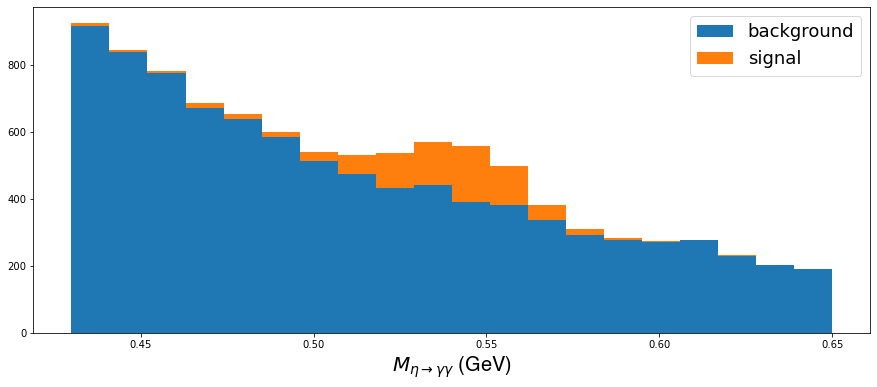

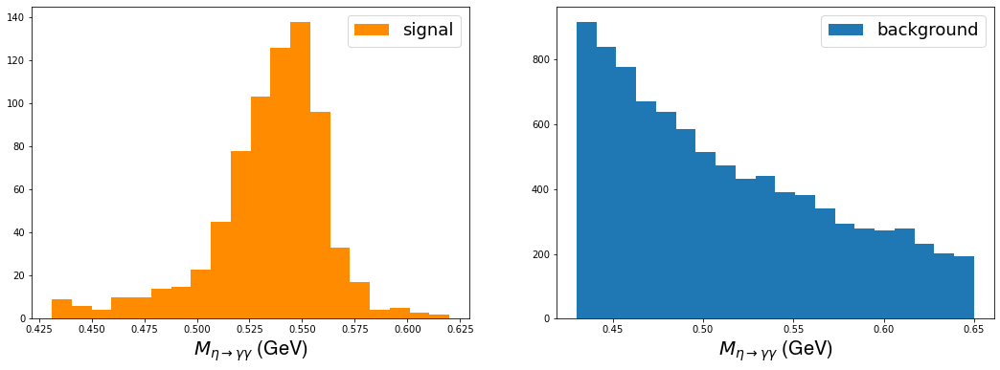

In [119]:
plt.figure(figsize=(15,6))
b2size_eta_counts_mincan, b2size_eta_edges_mincan, _ = plt.hist([b2size_eta_bkg_InvM_mincan, b2size_eta_sig_InvM_mincan],bins=20,histtype='barstacked', label=['background','signal'])
plt.xlabel(r'$M_{\eta \rightarrow \gamma \gamma}$ (GeV)', fontdict=form_label)
plt.legend(fontsize=18)

plt.figure(figsize=(18,6))
plt.subplot(121)
b2size_eta_sig_counts_mincan, b2size_eta_sig_edges_mincan, _ = plt.hist(b2size_eta_sig_InvM_mincan,bins=20,color ='darkorange', label=['signal'])
plt.xlabel(r'$M_{\eta \rightarrow \gamma \gamma}$ (GeV)', fontdict=form_label)
plt.legend(fontsize=18)

plt.subplot(122)
b2size_eta_bkg_counts_mincan, b2size_eta_bkg_edges_mincan, _ = plt.hist(b2size_eta_bkg_InvM_mincan,bins=20,histtype='barstacked', label=['background'])
plt.xlabel(r'$M_{\eta \rightarrow \gamma \gamma}$ (GeV)', fontdict=form_label)
plt.legend(fontsize=18)


In [177]:
np.sum(b2size_eta_bkg_counts_mincan)

9151.0

In [50]:
np.sum(b2size_eta_sig_counts_mincan)/mclumi

1.5229223744292237

In [29]:
np.max(b2size_eta_edges_mincan), np.max(b2size_eta_sig_edges_mincan)

(0.6499896355767897, 0.6383203339146357)

# b2size_data for fitting

There is a problem by peaking the y b2size_data for signal based on the both signal and background histogram. by looking at the hist you see maximum edge for dignal is 0.63 but the hist goes to 0.65, `so b2size_eta_y_sig_b2size_data = b2size_eta_counts_mincan[1] - b2size_eta_counts_mincan[0]` is a wrong approach.

In [122]:
# x range
b2size_eta_x_data = (b2size_eta_edges_mincan[1:] + b2size_eta_edges_mincan[:-1])/2

# mapped x range to [-1,1]
y = np.array(mapping_range(b2size_eta_edges_mincan, -1, 1))
b2size_eta_x_data_mapped = (y[1:] + y[:-1])/2

# y range
# signal
# b2size_eta_y_sig_b2size_data = b2size_eta_counts_mincan[1] - b2size_eta_counts_mincan[0]
b2size_eta_y_sig_data = b2size_eta_sig_counts_mincan
b2size_eta_yerr_sig = np.sqrt(b2size_eta_y_sig_data)
# background
b2size_eta_y_bkg_data = b2size_eta_counts_mincan[0]
b2size_eta_yerr_bkg = np.sqrt(b2size_eta_y_bkg_data)
# both signal and background
b2size_eta_y_data = (b2size_eta_counts_mincan[1] - b2size_eta_counts_mincan[0]) + b2size_eta_counts_mincan[0]
b2size_eta_yerr = np.sqrt(b2size_eta_y_data)

# Fitting

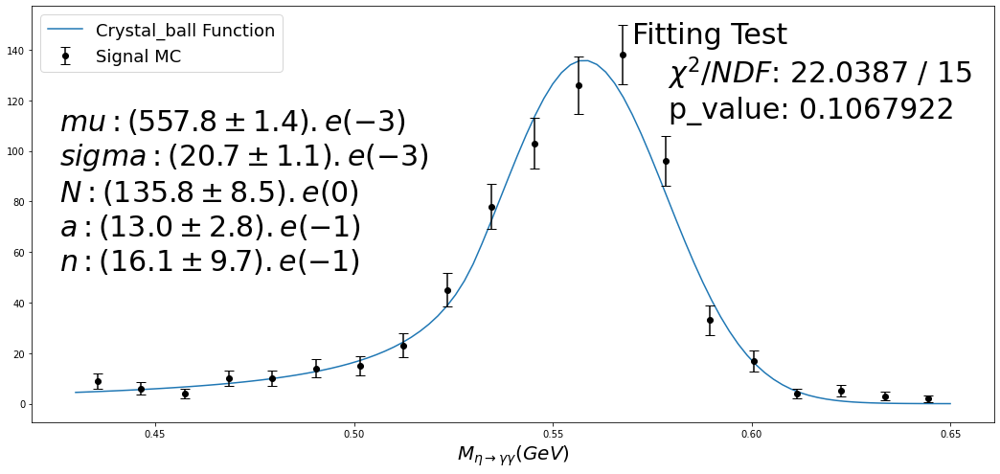

In [140]:
# fitting signal no mapping
p0_sig = [0.543, 0.016, 180, 0.9, 4]
b2size_eta_sig_popt, b2size_eta_sig_pcov, b2size_eta_sig_info, b2size_eta_sig_msg, b2size_eta_sig_ier = curve_fit(crystal_ball, b2size_eta_x_data, b2size_eta_y_sig_data, p0=p0_sig, full_output=True, sigma=b2size_eta_yerr_sig)

# degrees of freedom
b2size_eta_sig_ndf = ndf(b2size_eta_x_data, b2size_eta_sig_popt)

plt.figure(figsize=(18,8))
x_range = np.linspace(np.min(b2size_eta_edges_mincan), np.max(b2size_eta_edges_mincan), 100) 
plt.plot(x_range, crystal_ball(x_range, *b2size_eta_sig_popt), label='Crystal_ball Function')
plt.errorbar(b2size_eta_x_data, b2size_eta_y_sig_data, yerr=b2size_eta_yerr_sig, ls='', color='k', fmt='o', capsize=5, label='Signal MC')
plt.xlabel(r'$M_{\eta \rightarrow \gamma \gamma} (GeV)$', fontdict=form_label)

plt.text(0.57, 100, 
f'''Fitting Test
    $\chi^2/NDF$: {np.dot(b2size_eta_sig_info['fvec'], b2size_eta_sig_info['fvec']):.4f} / {b2size_eta_sig_ndf}
    p_value: {1 - stats.chi2.cdf(np.dot(b2size_eta_sig_info['fvec'], b2size_eta_sig_info['fvec']), b2size_eta_sig_ndf):.7f}
    ''', fontsize=30)

text = value_uncertainty_report(b2size_eta_sig_popt, b2size_eta_sig_pcov, ['mu', 'sigma', 'N', 'a', 'n'])
plt.text(0.426,40, text, fontsize=30)

plt.legend(fontsize=18, loc='upper left')
plt.show()

In [142]:
b2size_eta_bkg_popt

array([ 457.16793746, -354.83815273,  114.10406285,  -40.45921016])

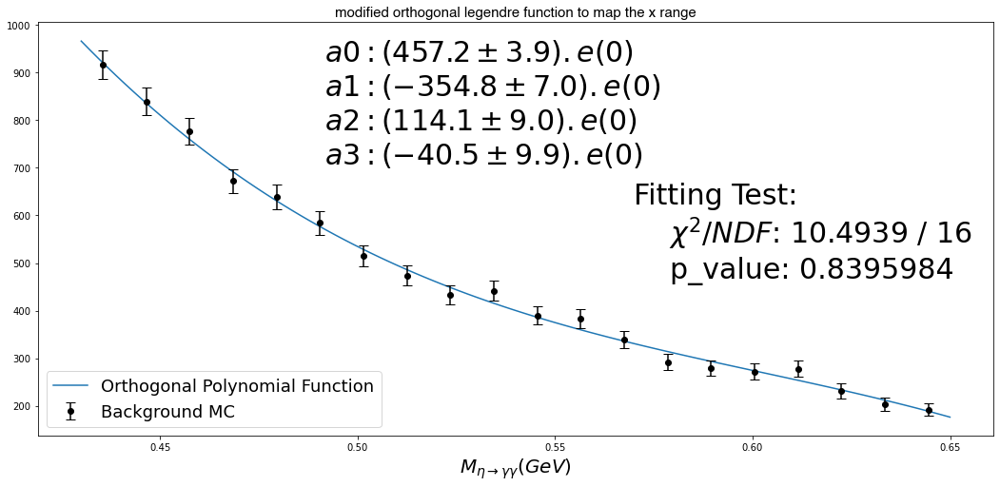

In [141]:
# fitting background 4 parameters modified legendre function
p0_bkg = list(np.zeros(4))
b2size_eta_bkg_popt, b2size_eta_bkg_pcov, b2size_eta_bkg_info, b2size_eta_bkg_msg, b2size_eta_bkg_ier = curve_fit(legendre_mod, b2size_eta_edges_mincan, b2size_eta_y_bkg_data, p0=p0_bkg, full_output=True, sigma=b2size_eta_yerr_bkg)

# degrees of freedom
b2size_eta_bkg_ndf = ndf(b2size_eta_x_data, b2size_eta_bkg_popt)

plt.figure(figsize=(18,8))
x_range = np.linspace(np.min(b2size_eta_edges_mincan), np.max(b2size_eta_edges_mincan), 100)
plt.plot(x_range, legendre_mod(x_range, *b2size_eta_bkg_popt, calculate_middle_point=False), label='Orthogonal Polynomial Function')
plt.errorbar(b2size_eta_x_data, b2size_eta_y_bkg_data, yerr=b2size_eta_yerr_bkg, ls='', color='k', fmt='o', capsize=5, label='Background MC')
plt.xlabel(r'$M_{\eta \rightarrow \gamma \gamma} (GeV)$', fontdict=form_label)
plt.title('modified orthogonal legendre function to map the x range', fontdict=form_title)
plt.text(0.57, 400, 
f'''Fitting Test:
    $\chi^2/NDF$: {np.dot(b2size_eta_bkg_info['fvec'], b2size_eta_bkg_info['fvec']):.4f} / {b2size_eta_bkg_ndf}
    p_value: {1 - stats.chi2.cdf(np.dot(b2size_eta_bkg_info['fvec'], b2size_eta_bkg_info['fvec']), b2size_eta_bkg_ndf):.7f}
    ''', fontsize=30)

text = value_uncertainty_report(b2size_eta_bkg_popt, b2size_eta_bkg_pcov)
plt.text(0.3, 0.58, text, transform=plt.gca().transAxes, fontsize=30)


plt.legend(fontsize=18, loc='lower left')
plt.show()

In [46]:
def b2size_crystal_legendre_fixed_params(x, *params):
    p_signal, p_background= params
    return p_signal * crystal_ball(x, *b2size_eta_sig_popt) + p_background * legendre_mod(x, *b2size_eta_bkg_popt, calculate_middle_point=False)

def b2size_crystal_legendre_mu_float(x, *params):
    p_signal, p_background, mu = params
    return p_signal * crystal_ball(x, mu, *b2size_eta_sig_popt[1:]) + p_background * legendre_mod(x, *b2size_eta_bkg_popt, calculate_middle_point=False)

def b2size_crystal_legendre_musigma_float(x, *params):
    p_signal, p_background, mu, sigma = params
    return p_signal * crystal_ball(x, mu, sigma, *b2size_eta_sig_popt[2:]) + p_background * legendre_mod(x, *b2size_eta_bkg_popt, calculate_middle_point=False)


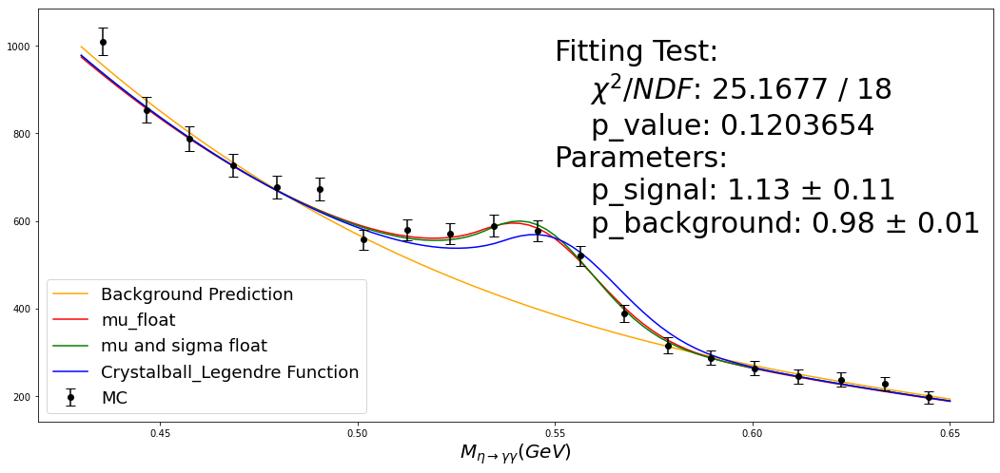

In [47]:
p0_fixed_params = [0.8, 1]
p0_mu_float = [0.8, 1, 0.54]
p0_musigma_float = [0.8, 1, 0.54, 0.01]
b2size_eta_popt_fixed_params, b2size_eta_pcov_fixed_params, b2size_eta_info_fixed_params, b2size_eta_msg_fixed_params, b2size_eta_ier_fixed_params = curve_fit(b2size_crystal_legendre_fixed_params, b2size_eta_x_data, b2size_eta_y_data, p0=p0_fixed_params, full_output=True, sigma=b2size_eta_yerr)
b2size_eta_popt_mu_float, b2size_eta_pcov_mu_float, b2size_eta_info_mu_float, b2size_eta_msg_mu_float, b2size_eta_ier_mu_float = curve_fit(b2size_crystal_legendre_mu_float, b2size_eta_x_data, b2size_eta_y_data, p0=p0_mu_float, full_output=True, sigma=b2size_eta_yerr)
b2size_eta_popt_musigma_float, b2size_eta_pcov_musigma_float, b2size_eta_info_musigma_float, b2size_eta_msg_musigma_float, b2size_eta_ier_musigma_float = curve_fit(b2size_crystal_legendre_musigma_float, b2size_eta_x_data, b2size_eta_y_data, p0=p0_musigma_float, full_output=True, sigma=b2size_eta_yerr)

# degrees of freedom
b2size_eta_ndf_fixed_params = ndf(b2size_eta_x_b2size_data, b2size_eta_popt_fixed_params)
b2size_eta_ndf_mu_float = ndf(b2size_eta_x_b2size_data, b2size_eta_popt_mu_float)
b2size_eta_ndf_musigma_float = ndf(b2size_eta_x_b2size_data, b2size_eta_popt_musigma_float)

plt.figure(figsize=(18,8))
x_range = np.linspace(np.min(b2size_eta_edges_mincan), np.max(b2size_eta_edges_mincan), 100)
plt.plot(x_range, legendre_mod(x_range, *b2size_eta_bkg_popt, calculate_middle_point=False), label='Background Prediction', color='orange')
plt.plot(x_range, b2size_crystal_legendre_mu_float(x_range, *b2size_eta_popt_mu_float), label='mu_float', color='r')
plt.plot(x_range, b2size_crystal_legendre_musigma_float(x_range, *b2size_eta_popt_musigma_float), label='mu and sigma float', color='g')
plt.plot(x_range, b2size_crystal_legendre_fixed_params(x_range, *b2size_eta_popt_fixed_params), label='Crystalball_Legendre Function', color='b')
plt.errorbar(b2size_eta_x_data, b2size_eta_y_data, yerr=b2size_eta_yerr, ls='', color='k', fmt='o', capsize=5, label='MC')
plt.xlabel(r'$M_{\eta \rightarrow \gamma \gamma} (GeV)$', fontdict=form_label)
plt.text(0.55, 500,f'''
Fitting Test:
    $\chi^2/NDF$: {np.dot(b2size_eta_info_fixed_params['fvec'], b2size_eta_info_fixed_params['fvec']):.4f} / {b2size_eta_ndf_fixed_params}
    p_value: {1 - stats.chi2.cdf(np.dot(b2size_eta_info_fixed_params['fvec'], b2size_eta_info_fixed_params['fvec']), b2size_eta_ndf_fixed_params):.7f}
Parameters:
    p_signal: {b2size_eta_popt_fixed_params[0]:.2f} \u00B1 {np.sqrt(np.diag(b2size_eta_pcov_fixed_params))[0]:.2f}
    p_background: {b2size_eta_popt_fixed_params[1]:.2f} \u00B1 {np.sqrt(np.diag(b2size_eta_pcov_fixed_params))[1]:.2f}
    ''', fontsize=30)

plt.legend(fontsize=18, loc='lower left')
plt.show()

In [35]:
from prettytable import PrettyTable

# Specify the Column Names while initializing the Table
myTable = PrettyTable(["Type", "p_signal", "p_background", "chi_squared/NDF", "p_value"])

# Add rows
myTable.add_row(["fixed sig params", f"{b2size_eta_popt_fixed_params[0]:.3f} \u00B1 {np.sqrt(np.diag(b2size_eta_pcov_fixed_params))[0]:.6f}", f"{b2size_eta_popt_fixed_params[1]:.3f} \u00B1 {np.sqrt(np.diag(b2size_eta_pcov_fixed_params))[1]:.6f}", f"{np.dot(b2size_eta_info_fixed_params['fvec'], b2size_eta_info_fixed_params['fvec']):.4f} / {b2size_eta_ndf_fixed_params}", f"{1 - stats.chi2.cdf(np.dot(b2size_eta_info_fixed_params['fvec'], b2size_eta_info_fixed_params['fvec']), b2size_eta_ndf_fixed_params):.7f}"])
myTable.add_row(["mu floats", f"{b2size_eta_popt_mu_float[0]:.3f} \u00B1 {np.sqrt(np.diag(b2size_eta_pcov_mu_float))[0]:.6f}", f"{b2size_eta_popt_mu_float[1]:.3f} \u00B1 {np.sqrt(np.diag(b2size_eta_pcov_mu_float))[1]:.6f}", f"{np.dot(b2size_eta_info_mu_float['fvec'], b2size_eta_info_mu_float['fvec']):.4f} / {b2size_eta_ndf_mu_float}", f"{1 - stats.chi2.cdf(np.dot(b2size_eta_info_mu_float['fvec'], b2size_eta_info_mu_float['fvec']), b2size_eta_ndf_mu_float):.7f}"])
myTable.add_row(["mu and sigma float", f"{b2size_eta_popt_musigma_float[0]:.3f} \u00B1 {np.sqrt(np.diag(b2size_eta_pcov_musigma_float))[0]:.6f}", f"{b2size_eta_popt_musigma_float[1]:.3f} \u00B1 {np.sqrt(np.diag(b2size_eta_pcov_musigma_float))[1]:.6f}", f"{np.dot(b2size_eta_info_musigma_float['fvec'], b2size_eta_info_musigma_float['fvec']):.4f} / {b2size_eta_ndf_musigma_float}", f"{1 - stats.chi2.cdf(np.dot(b2size_eta_info_musigma_float['fvec'], b2size_eta_info_musigma_float['fvec']), b2size_eta_ndf_musigma_float):.7f}"])


print(myTable)

+--------------------+------------------+------------------+-----------------+-----------+
|        Type        |     p_signal     |   p_background   | chi_squared/NDF |  p_value  |
+--------------------+------------------+------------------+-----------------+-----------+
|  fixed sig params  | 1.130 ± 0.114276 | 0.978 ± 0.014352 |   25.1677 / 18  | 0.1203654 |
|     mu floats      | 1.205 ± 0.095812 | 0.973 ± 0.011721 |   15.5537 / 17  | 0.5556652 |
| mu and sigma float | 1.239 ± 0.113358 | 0.978 ± 0.013656 |   15.1381 / 16  | 0.5145476 |
+--------------------+------------------+------------------+-----------------+-----------+
